<a href="https://colab.research.google.com/github/DivinSphere/Analise-Mercado/blob/main/Financas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

```
Código	Empresa	Segmento
RRRP3	3R Petroleum	Óleo e gás
AMER3	Americanas	Varejo
ASAI3	Assaí	Hipermercado
AZUL4	Azul	Aviação
BBDC4	Bradesco	Banco
BBAS3	Banco do Brasil	Banco
CRFB3	Carrefour	Hipermercado
GOLL4	Gol	Aviação
ITUB4	Itaú	Banco
MGLU3	Magazine Luiza	Varejo
PCAR3	Pão de Açúcar	Hipermercado
PETR4	Petrobras	Óleo e gás
VIVT3	Telefônica	Telecomunicação
TIMS3	TIM	Telecomunicação
```



In [ ]:
#Faz os dowloads de tudo que é necessário para executar os códigos do projeto
!pip install yfinance --upgrade --no-cache-dir
!pip install neuralprophet
!pip install mplfinance
!pip install prophet


#Importa todas as bibliotecas que serão utilizadas no projeto
from statsmodels.tsa.seasonal import seasonal_decompose
from neuralprophet import NeuralProphet
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.offline as py
from prophet import Prophet
import mplfinance as mpf
import plotly.io as pio
import yfinance as yf 
import seaborn as sns
import pandas as pd
import numpy as np
import requests

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 13.3 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 98 kB 4.1 MB/s 
     |████████████████████████████████| 1.6 MB 34.5 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 70 kB 3.5 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

#Cria um vetor de códigos das ações
ticks=[
  "RRRP3.SA",
  "AMER3.SA",
  "ASAI3.SA",
  "AZUL4.SA",
  "BBDC4.SA",
  "BBAS3.SA",
  "CRFB3.SA",
  "GOLL4.SA",
  "ITUB4.SA",
  "MGLU3.SA",
  "PCAR3.SA",
  "PETR4.SA",
  "VIVT3.SA",
  "TIMS3.SA"
]

#Cria um vetor de nomes das ações
nomes=[
  "3R Petroleum",
  "Americanas",
  "Assaí",
  "Azul",
  "Bradesco",
  "Banco do Brasil",
  "Carrefour",
  "Gol",
  "Itaú",
  "Magazine Luiza",
  "Pão de Açúcar",
  "Petrobras",
  "Telefônica",
  "TIM"
]

#Armazena o vetor de cores para serem utilizados nos gráficos
cores=[
'red',
'green',
'blue',
'black',
'yellow',
'darkturquoise',
'purple',
'pink',
'orange',
'lime',
'peru',
'plum',
'navy',
'grey'
]

#Configura o visual dos plots
plt.style.use('default')
plt.rcParams["figure.figsize"] = (20,7)

#Utiliza yfinance para fazer download dos dados
df = yf.download(ticks,start='2017-01-02',end='2022-07-29')["Adj Close"]

#Substitui os códigos das ações pelos nomes delas
df.columns=nomes

#Cria a tabela de diferença de um dia para o outro
df_rent= df / df.shift() * 100 - 100

#Cria a tabela de diferença percentual
df_percentual=pd.DataFrame()

for i in nomes:
  df_percentual[i]=df[i]/df[i].dropna()[0]*100-100


[**********************67%*******                ]  10 of 15 completedGot error from yahoo api for ticker BVSP.SA, Error: {'code': 'Not Found', 'description': 'No data found, symbol may be delisted'}
[**********************73%**********             ]  11 of 15 completed

Exception in thread Thread-38:
Traceback (most recent call last):
  File "/usr/lib/python3.7/threading.py", line 926, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.7/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.7/dist-packages/multitasking/__init__.py", line 104, in _run_via_pool
    return callee(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/yfinance/multi.py", line 201, in _download_one_threaded
    keepna, timeout)
  File "/usr/local/lib/python3.7/dist-packages/yfinance/multi.py", line 218, in _download_one
    timeout=timeout)
  File "/usr/local/lib/python3.7/dist-packages/yfinance/base.py", line 168, in history
    end = utils._parse_user_dt(end, tz)
  File "/usr/local/lib/python3.7/dist-packages/yfinance/utils.py", line 157, in _parse_user_dt
    dt = _tz.timezone(exchange_tz).localize(dt)
  File "/usr/local/lib/python3.7/dist-packages/pytz/__init__.py", line 168, in timezone
    raise

[**********************87%*****************      ]  13 of 15 completed

KeyboardInterrupt: ignored

In [ ]:
#utilizado para exportar a base de dados caso precise ser utilizada fora do projeto
df.to_csv("dados.csv", encoding="utf8",sep=";") 

In [ ]:
#Cria função para decompor os dados, mostrando o valor original, tendência, sazonalidade, ruido
def decomp(df,name,cor="black"):
  dados=df.dropna()

  decomposition = seasonal_decompose(dados,model='additive',period = 30)

  trend = decomposition.trend
  seasonal = decomposition.seasonal
  noise = decomposition.resid
  plt.subplot(411)
  plt.title(name)
  plt.plot(dados, label='Original',color=cor)
  plt.legend(loc='best')
  plt.subplot(412)
  plt.plot(trend, label='Trend',color=cor)
  plt.legend(loc='best')
  plt.subplot(413)
  plt.plot(seasonal,label='Seasonality',color=cor)
  plt.legend(loc='best')
  plt.subplot(414)
  plt.plot(noise, label='Noise',color=cor)
  plt.legend(loc='best')
  plt.show()


In [ ]:
#análise exploratória dos dados baixados
df.describe().round(3)

,3R Petroleum,Americanas,Assaí,Azul,Bradesco,Banco do Brasil,Carrefour,Gol,Itaú,Magazine Luiza,Pão de Açúcar,Petrobras,Telefônica,TIM
count,1387.000,354.000,1319.000,1387.000,1387.000,1250.000,1387.000,1387.000,1387.000,1387.000,1387.000,422.000,1387.000,1387.000
mean,42.316,15.468,32.255,30.460,18.197,17.224,19.272,26.303,9.238,55.876,13.072,37.614,11.330,35.745
std,26.369,1.853,11.011,6.474,3.370,2.761,8.296,4.138,7.800,31.400,4.550,5.755,1.686,7.571
min,9.652,11.209,10.350,18.988,11.686,12.473,4.510,17.811,0.351,6.770,5.862,20.800,6.494,22.393
25%,23.148,14.191,23.995,25.496,15.475,14.319,13.045,22.803,2.912,22.645,9.373,34.200,10.299,29.235
50%,33.625,15.522,29.400,29.130,18.051,17.821,18.300,25.870,5.970,76.294,12.992,37.560,11.282,36.131
75%,60.078,17.020,38.680,34.500,20.847,19.263,23.750,29.801,14.189,81.595,15.559,41.675,12.501,41.282
max,123.519,19.286,62.410,45.521,25.703,23.213,43.790,35.116,27.402,116.698,26.452,49.310,15.843,53.444


In [ ]:
#análise exploratória da rentabilidade
df_rent.describe().round(3)

,3R Petroleum,Americanas,Assaí,Azul,Bradesco,Banco do Brasil,Carrefour,Gol,Itaú,Magazine Luiza,Pão de Açúcar,Petrobras,Telefônica,TIM
count,1386.000,353.000,1318.000,1386.000,1386.000,1249.000,1386.000,1386.000,1386.000,1386.000,1386.000,421.000,1386.000,1386.000
mean,0.104,0.060,0.036,0.074,0.054,0.046,0.147,0.041,0.215,0.125,0.136,0.154,0.066,0.064
std,3.821,2.017,4.049,2.572,2.259,2.029,4.457,2.067,3.820,6.264,2.934,3.256,1.977,1.761
min,-16.972,-5.739,-36.868,-19.905,-14.274,-11.937,-36.294,-17.964,-21.077,-86.646,-29.698,-12.493,-14.777,-12.359
25%,-2.093,-1.153,-1.644,-1.147,-1.124,-1.210,-2.132,-1.116,-1.802,0.000,-1.227,-1.679,-1.048,-0.828
50%,-0.106,0.000,0.032,0.042,0.000,0.000,-0.045,0.000,0.000,0.000,0.107,0.082,0.000,0.000
75%,2.230,1.292,1.717,1.314,1.238,1.209,2.214,1.164,2.094,0.000,1.488,1.980,1.126,0.917
max,27.395,8.943,29.874,17.126,16.867,12.766,35.062,11.059,23.529,139.130,22.222,12.928,9.963,12.322


In [ ]:
#análise exploratória da variação percentual
df_percentual.describe().round(3)

,3R Petroleum,Americanas,Assaí,Azul,Bradesco,Banco do Brasil,Carrefour,Gol,Itaú,Magazine Luiza,Pão de Açúcar,Petrobras,Telefônica,TIM
count,1387.000,354.000,1319.000,1387.000,1387.000,1250.000,1387.000,1387.000,1387.000,1387.000,1387.000,422.000,1387.000,1387.000
mean,338.407,9.905,43.996,49.847,55.711,30.402,327.326,47.679,2336.097,32.407,77.047,80.838,74.456,56.104
std,273.194,13.165,49.156,31.848,28.840,20.900,183.936,23.230,2056.926,74.408,61.624,27.669,25.955,33.061
min,0.000,-20.359,-53.795,-6.589,0.000,-5.570,0.000,0.000,-7.413,-83.958,-20.600,0.000,0.000,-2.205
25%,139.821,0.831,7.121,25.423,32.425,8.406,189.246,28.027,667.850,-46.339,26.945,64.423,58.582,27.674
50%,248.358,10.285,31.250,43.303,54.469,34.918,305.765,45.248,1474.355,80.791,75.960,80.577,73.726,57.787
75%,522.424,20.927,72.679,69.722,78.388,45.835,426.608,67.317,3641.752,93.354,110.727,100.361,92.489,80.282
max,1179.684,37.027,178.616,123.937,119.945,75.742,870.953,97.159,7126.096,176.537,258.263,137.067,143.954,133.398


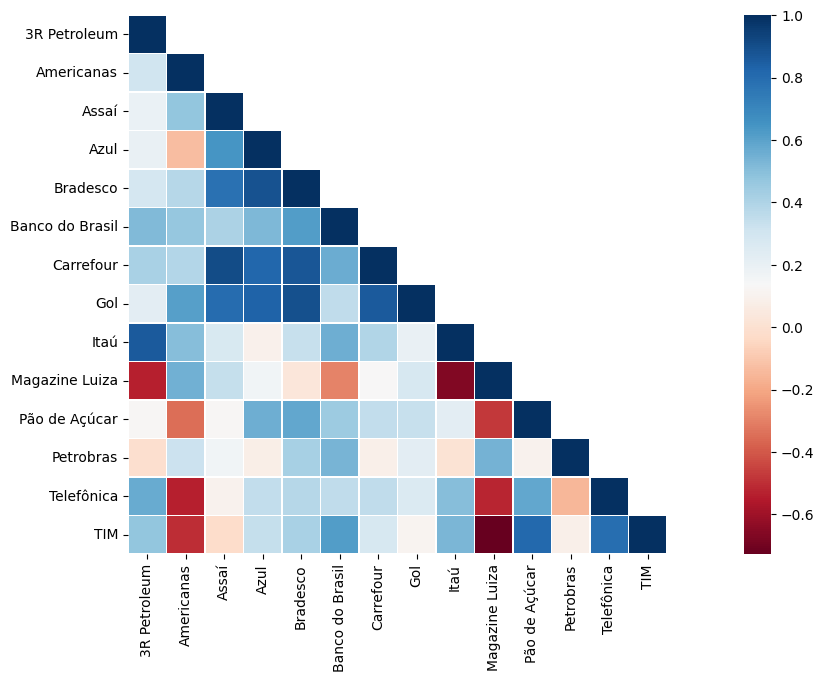

In [ ]:
#Geração de matriz de correlação 1
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask, 1)] = True
sns.heatmap(df.corr(), mask=mask, cmap='RdBu', square=True, linewidths=.5)

In [ ]:
df.corr(method='pearson').to_csv("dados.csv", encoding="utf8",sep=";")

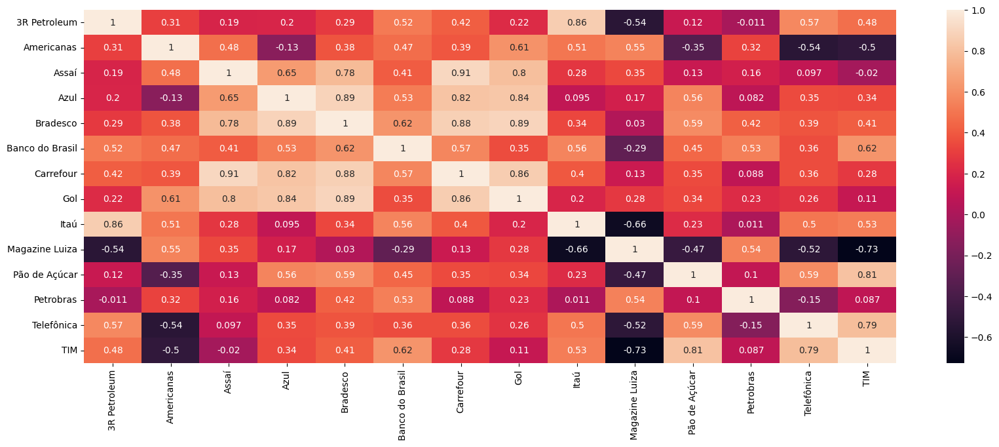

In [ ]:
#Geração de matriz de correlação 2
sns.heatmap(df.corr(method='pearson'), annot=True)
plt.show()

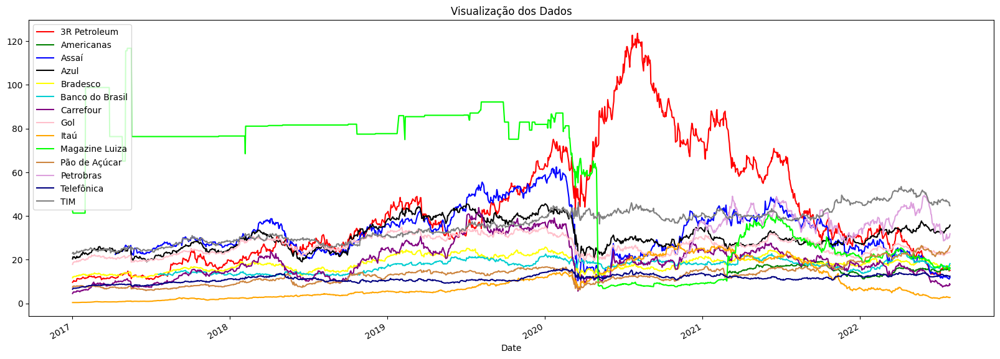

In [ ]:
#Plota o gráfico das ações
df.plot(color=cores,title="Visualização dos Dados")

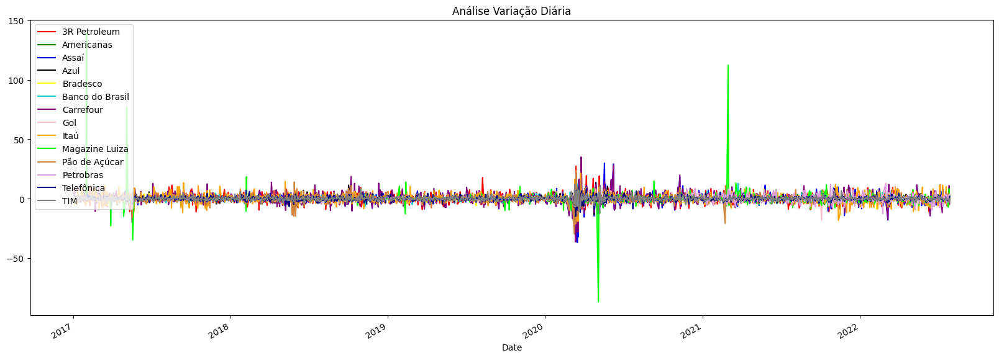

In [ ]:
#Plota o gráfico da variação Diária
df_rent.plot(color=cores,title="Análise Variação Diária")

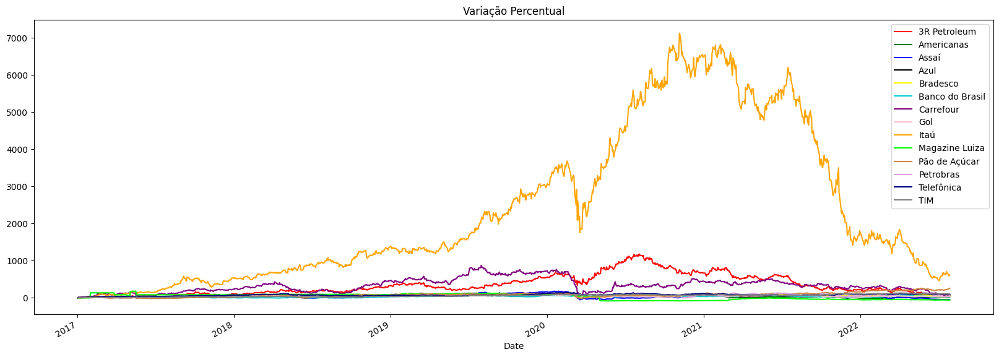

In [ ]:
#plota o gráfico de diferença percentual
#todas as ações ficam na mesma escala
#o dia inicial tem variação zero
df_percentual.plot(color=cores,title="Variação Percentual")

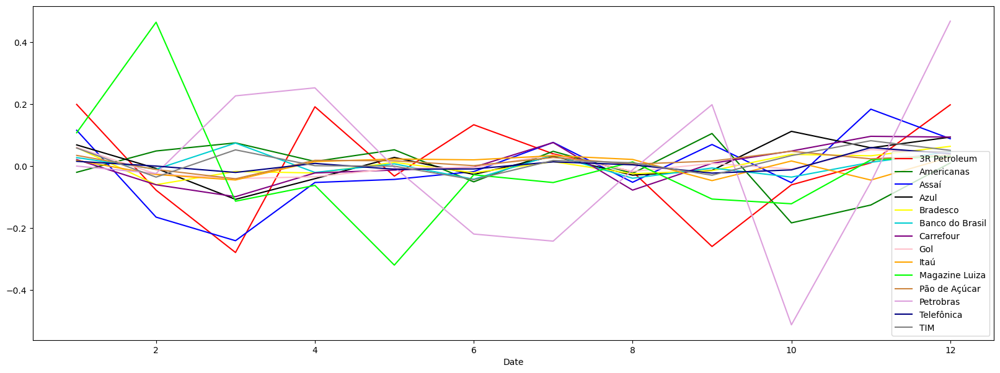

In [ ]:
#gráfico de média mensal das ações
df.diff().groupby(df.index.month).mean().plot(color=cores)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new inst

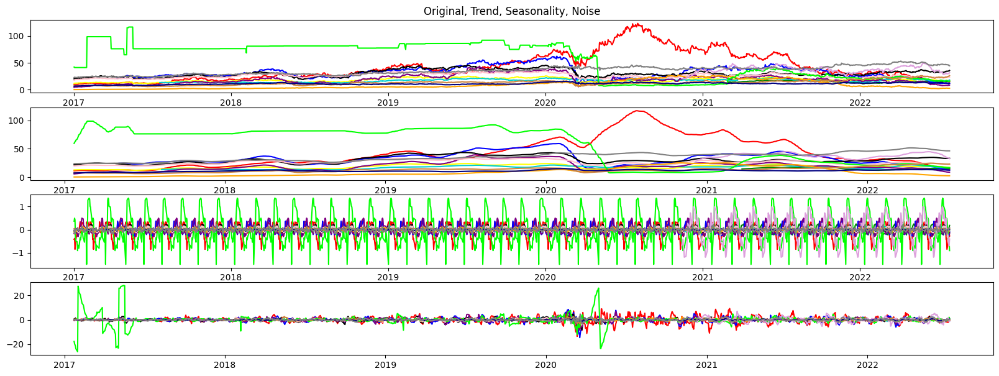

In [ ]:
#Usado para fazer a decomposição de todas as ações em um mesmo gráfico
def decomp2(df,cor="black"):
  dados=df.dropna()

  decomposition = seasonal_decompose(dados,model='additive',period = 30)

  trend = decomposition.trend
  seasonal = decomposition.seasonal
  noise = decomposition.resid
  plt.subplot(411)
  plt.title('Original, Trend, Seasonality, Noise')
  plt.plot(dados, label='Original',color=cor)
  plt.subplot(412)
  plt.plot(trend, label='Trend',color=cor)
  plt.subplot(413)
  plt.plot(seasonal,label='Seasonality',color=cor)
  plt.subplot(414)
  plt.plot(noise, label='Noise',color=cor)


for i in range(len(nomes)):
  decomp2(df[nomes[i]],cor=cores[i])


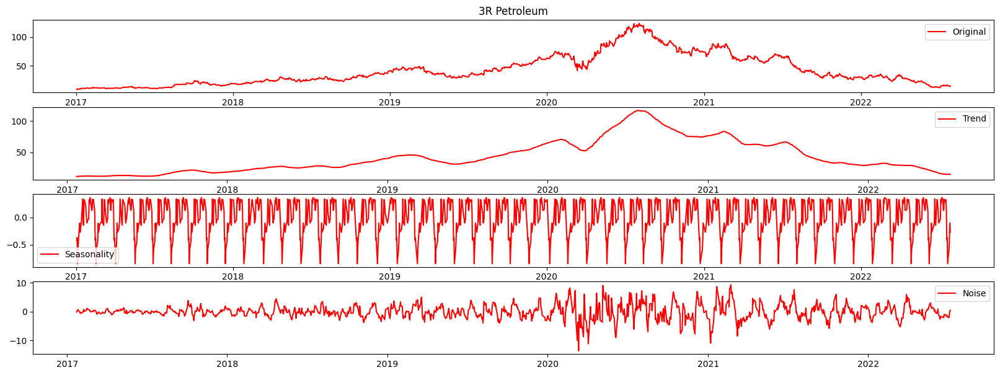

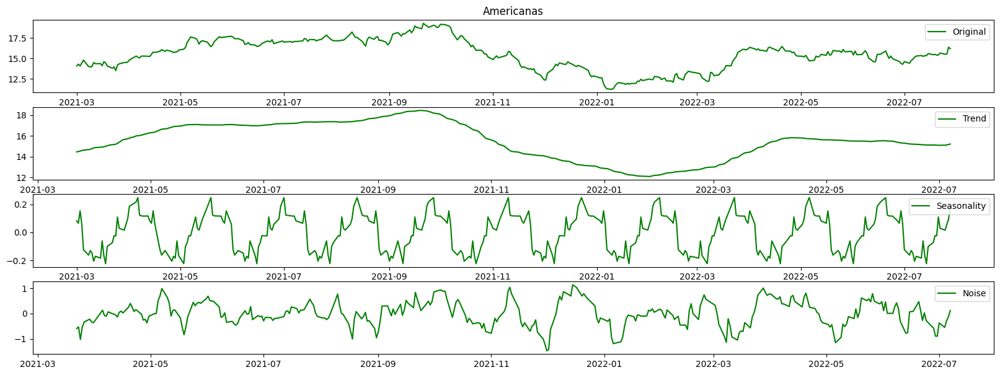

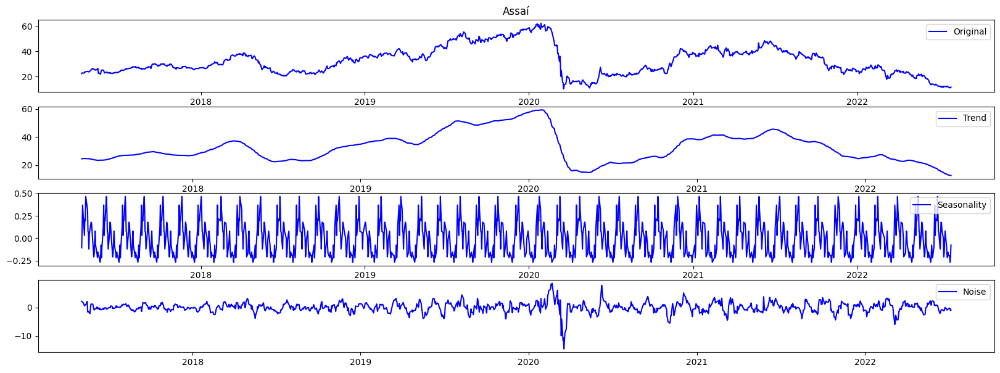

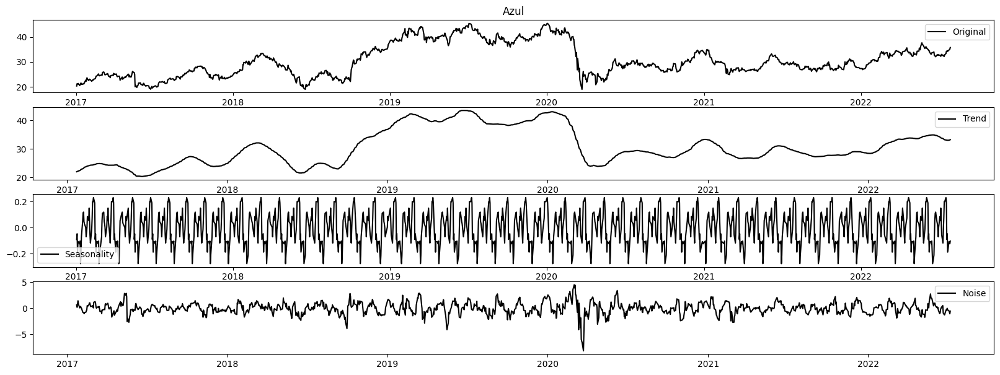

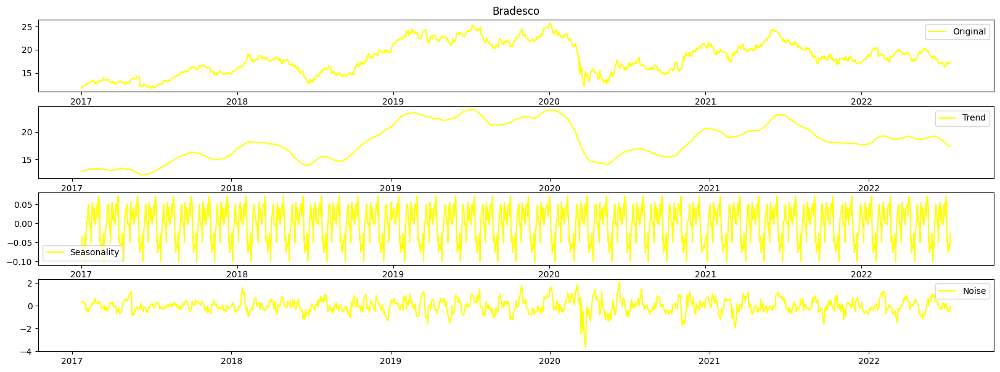

...

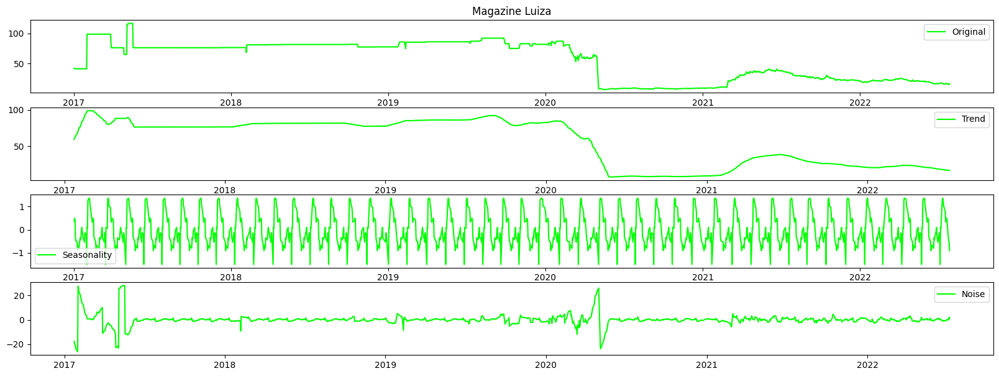

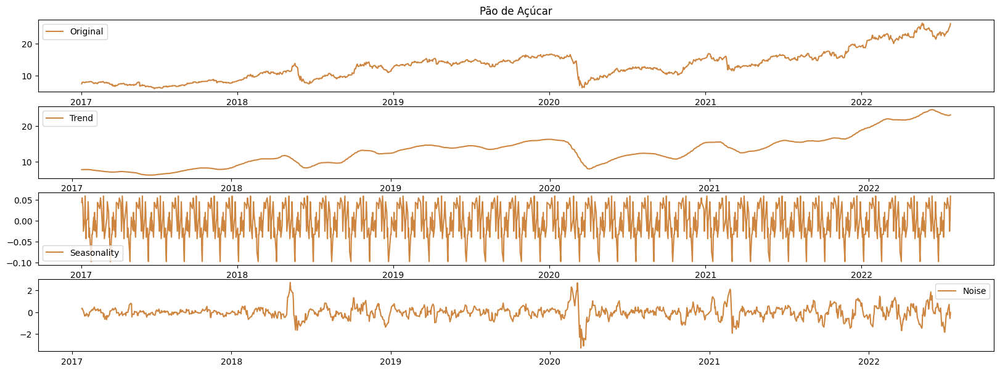

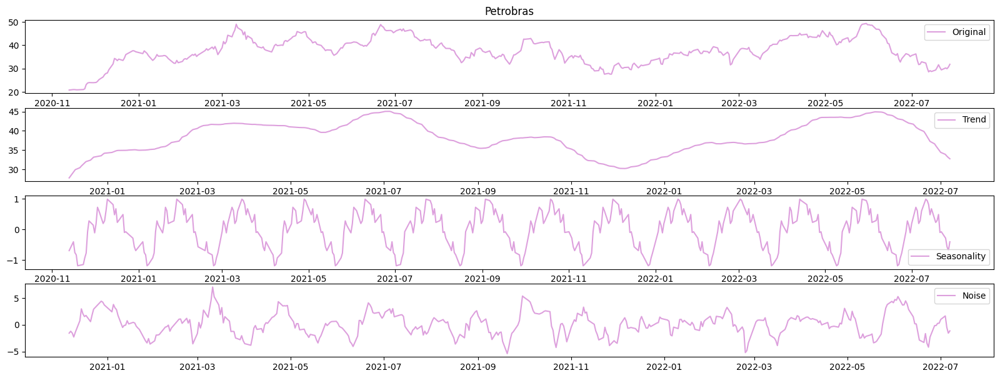

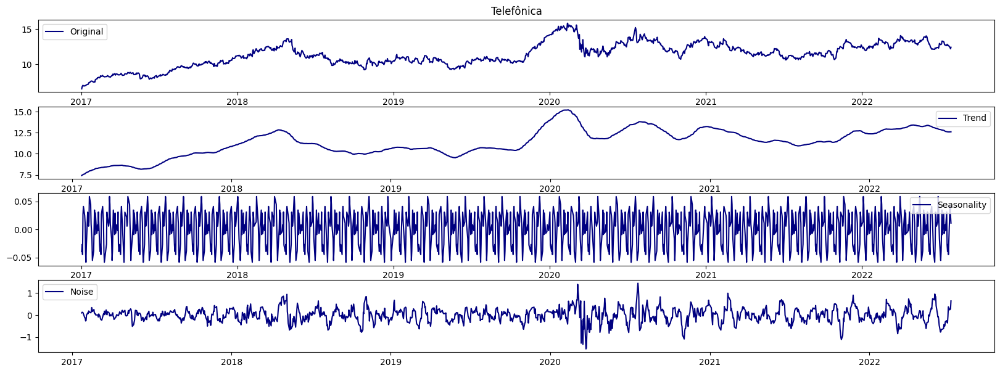

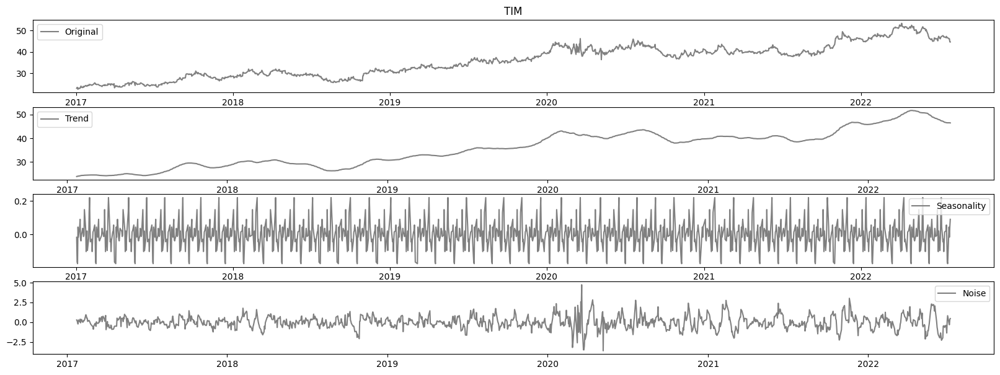

In [ ]:
#faz as decomposições de cada ação
for i in range(len(nomes)):
  decomp(df[nomes[i]],nomes[i],cor=cores[i])




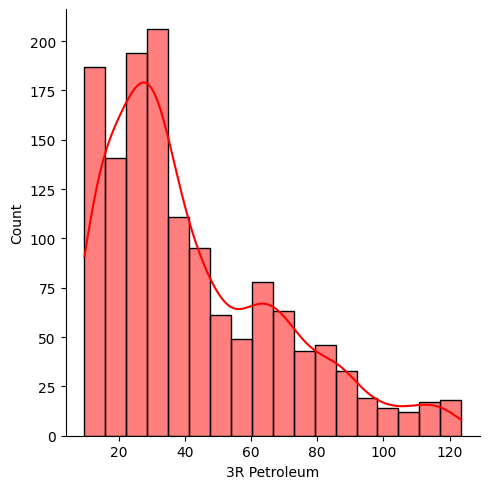

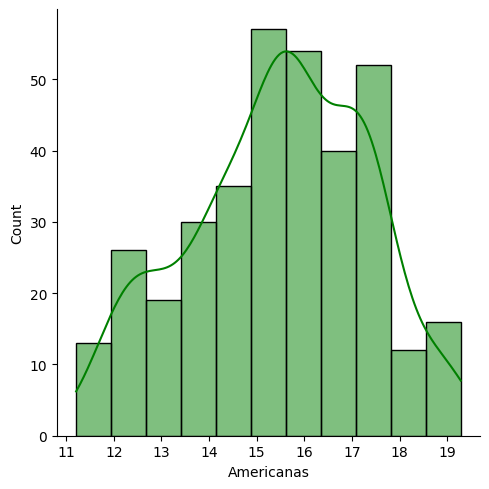

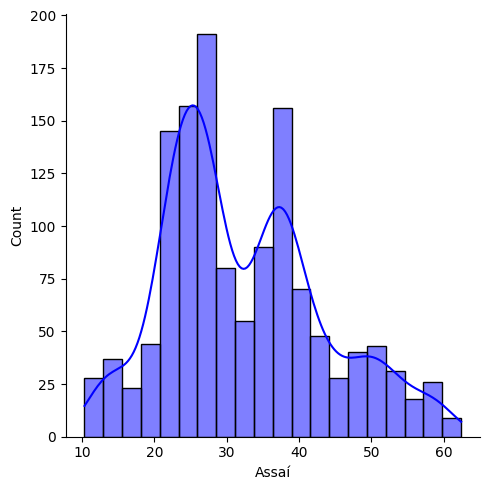

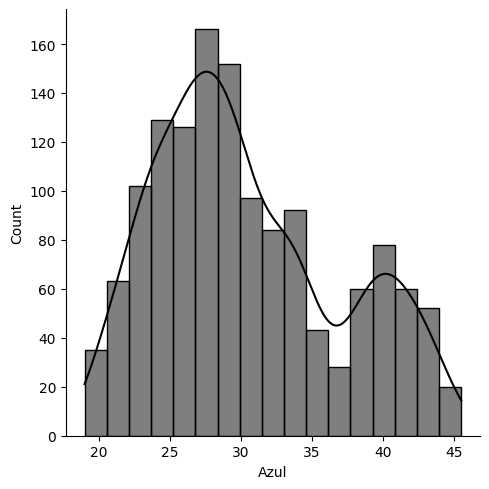

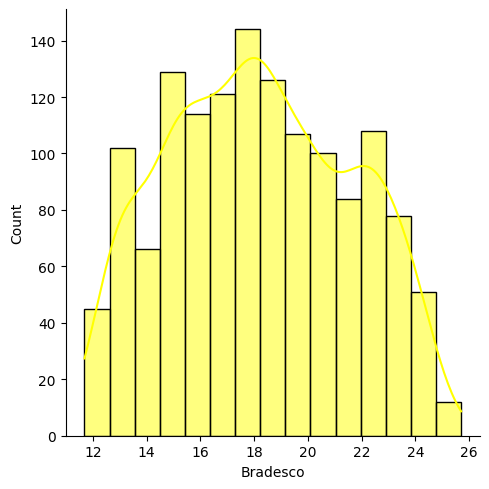

...

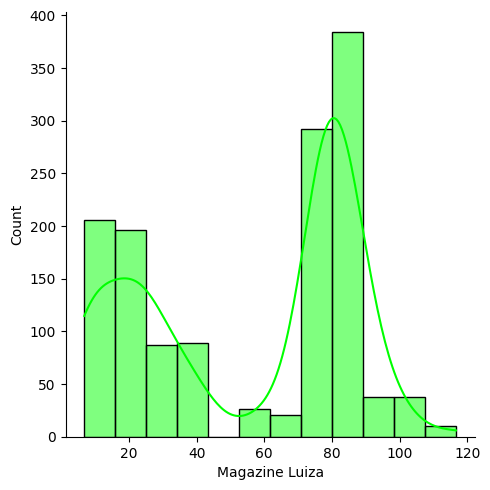

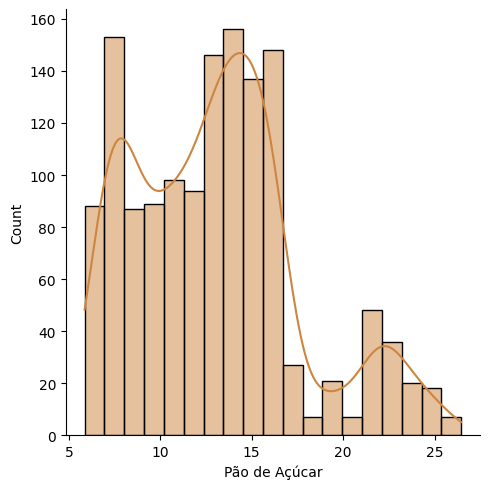

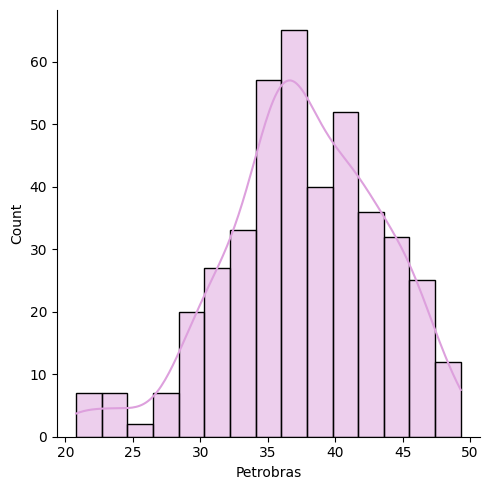

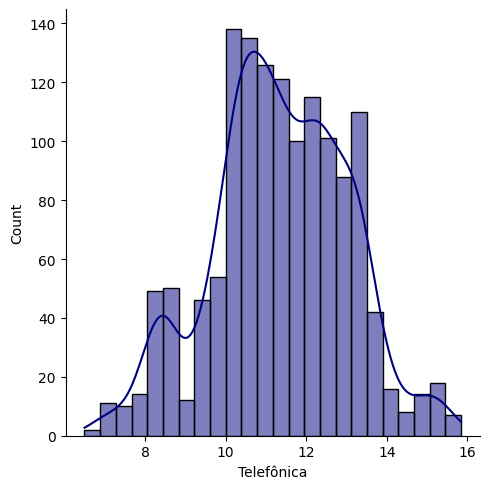

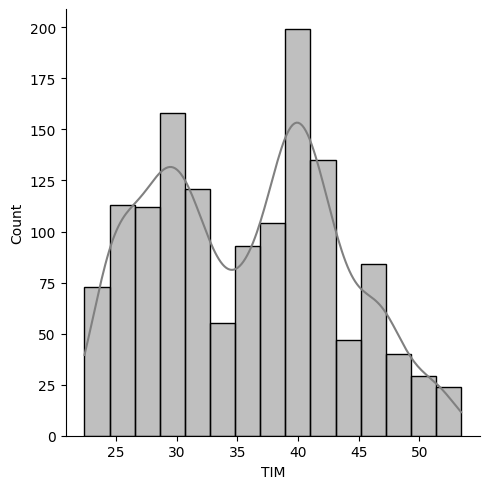

In [ ]:
#plota o gráfico de barras das ações para indicar sua tendência de preço
for i in range(len(nomes)):
  sns.displot(data=df[nomes[i]],  kde=True ,color=cores[i])
  plt.show()


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmphles4h68/7ny2fpfl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphles4h68/883i01ys.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90232', 'data', 'file=/tmp/tmphles4h68/7ny2fpfl.json', 'init=/tmp/tmphles4h68/883i01ys.json', 'output', 'file=/tmp/tmphles4h68/prophet_modelns0376d1/prophet_model-20221024131628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:16:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:16:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


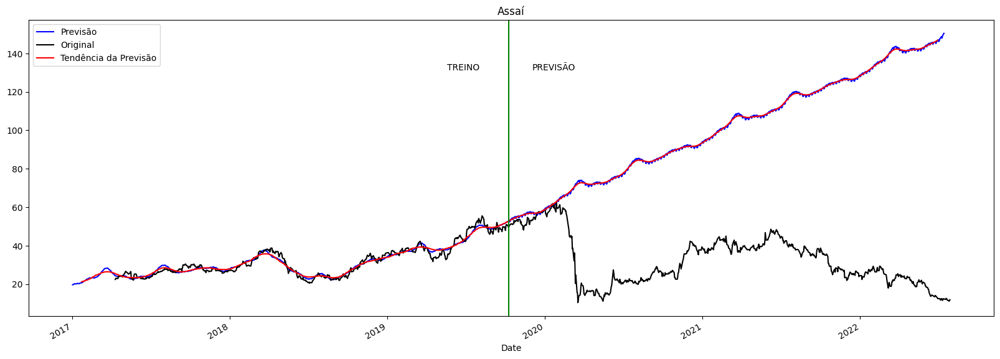

In [ ]:
#Teste de previsão
#Pega metade dos dados disponíveis e utiliza de treinamento, para prever a outra metade dos dados
#Plota o resultado da previsão

df_prev=pd.DataFrame()

nome_prever=nomes[2]

titulo="Teste de Previsão - "+nome_prever

data=df[nome_prever].head(693)
        
dados=pd.DataFrame(data={'ds': data.index.values.astype('datetime64[D]'), 'y': data.values})

modelo = Prophet()
modelo.fit(dados)

st_futuro = modelo.make_future_dataframe(periods= 1010)

previsao_Prophet = modelo.predict(st_futuro)

df_prev[titulo]=previsao_Prophet['yhat']

df_prev['Date']=st_futuro
df_prev=df_prev.set_index('Date')

df_prev.plot()

df[nome_prever].plot()

seasonal_decompose(df_prev,model='additive',period = 30).trend.plot()

plt.gca().get_lines()[0].set_color("blue")
plt.gca().get_lines()[1].set_color("black")
plt.gca().get_lines()[2].set_color("red")

plt.title(nome_prever)
plt.axvline(x = df[nome_prever].index[693], color = "green") 
plt.text(df[nome_prever].index[730],plt.gca().get_ylim()[1]/1.2, 'PREVISÃO')
plt.text(df[nome_prever].index[593],plt.gca().get_ylim()[1]/1.2, 'TREINO')
plt.legend(["Previsão","Original","Tendência da Previsão"])
plt.show()


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmphles4h68/3lfelpz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphles4h68/_4l4unxw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84211', 'data', 'file=/tmp/tmphles4h68/3lfelpz3.json', 'init=/tmp/tmphles4h68/_4l4unxw.json', 'output', 'file=/tmp/tmphles4h68/prophet_modelzr9cywi2/prophet_model-20221024131631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:16:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:16:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality.

,3R Petroleum,Americanas,Assaí,Azul,Bradesco,Banco do Brasil,Carrefour,Gol,Itaú,Magazine Luiza,Pão de Açúcar,Petrobras,Telefônica,TIM
Date,,,,,,,,,,,,,,
2017-01-02,6.843781,-42.150816,28.634236,22.701704,11.849524,15.202506,7.588805,19.354917,0.074541,68.148494,7.067761,-150.346144,7.350543,21.878441
2017-01-03,7.264313,-42.105193,28.623352,22.785972,11.926659,15.218745,7.569538,19.401310,0.113094,67.712020,7.145605,-150.326307,7.375141,21.940207
2017-01-04,7.662533,-42.045008,28.786180,22.836276,11.980423,15.240992,7.645164,19.485965,0.118644,67.603414,7.226463,-150.258130,7.413941,21.979588
2017-01-05,7.795399,-41.981817,28.875154,22.840219,12.018938,15.305246,7.612589,19.522077,0.129339,67.133521,7.267692,-150.377409,7.410401,21.989580
2017-01-06,7.986197,-41.963759,29.154611,22.926484,12.111848,15.337546,7.726472,19.653168,0.159760,66.788961,7.300853,-150.149953,7.439126,22.074125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2027-07-23,-183.902064,13.964475,-118.002247,53.786729,-1.057226,9.500202,-46.268333,-1.323498,-86.312267,-52.474915,67.404677,3.586955,20.632767,93.954354
2027-07-24,-182.978387,14.008314,-121.141677,53.336147,-0.654552,8.625796,-46.979450,-1.849368,-86.624060,-72.042101,68.073054,0.591782,20.426988,94.864590
2027-07-25,-183.192722,14.007530,-121.162091,53.332057,-0.679380,8.608155,-46.997718,-1.855764,-86.680452,-72.042196,68.100215,0.573195,20.416904,94.884379


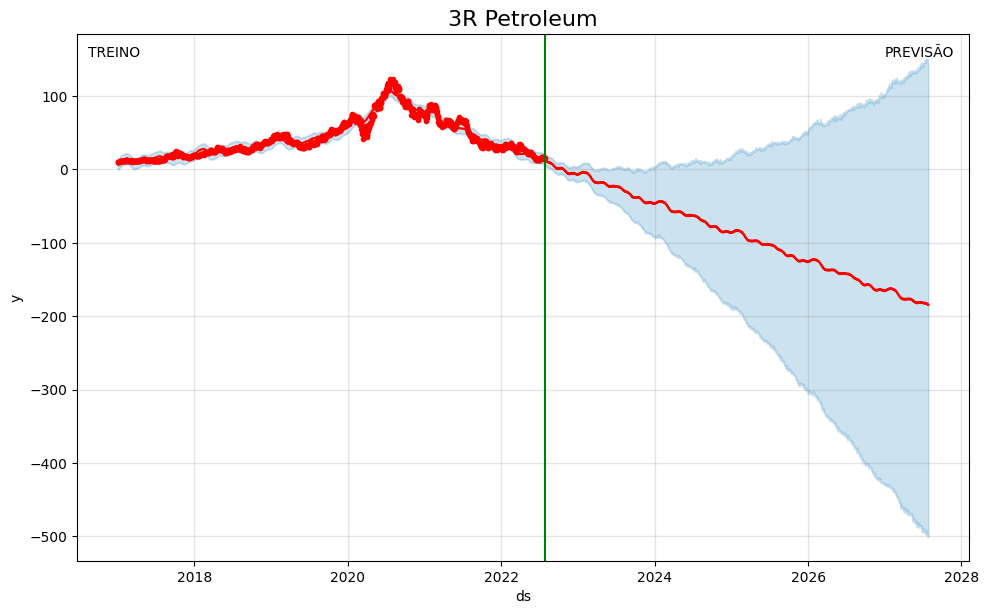

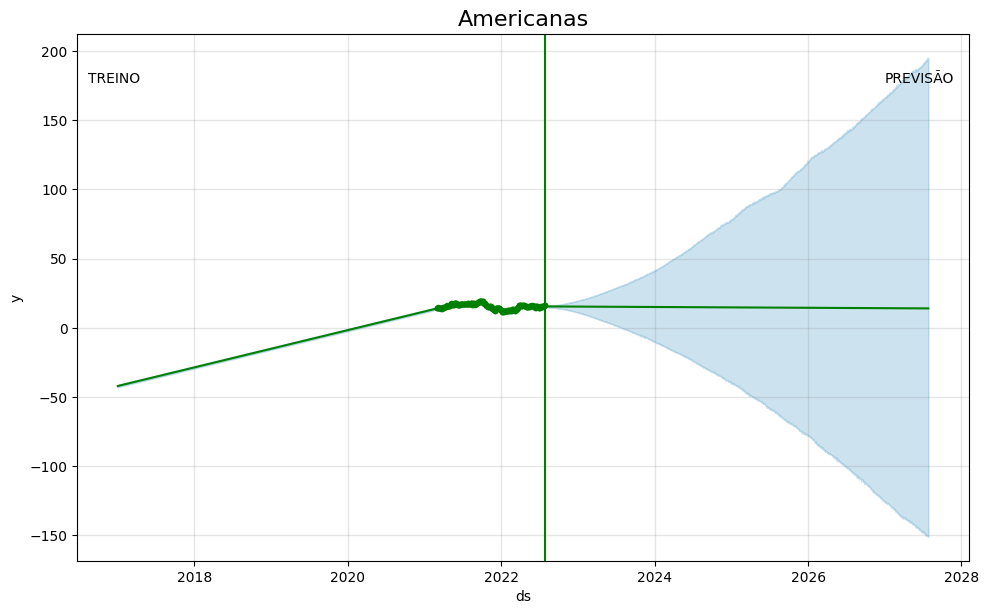

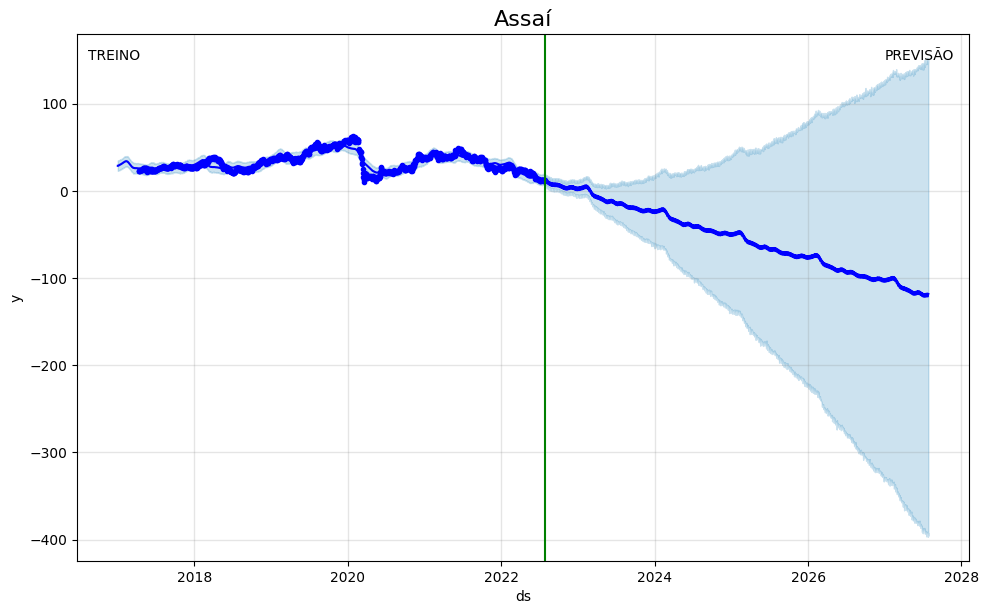

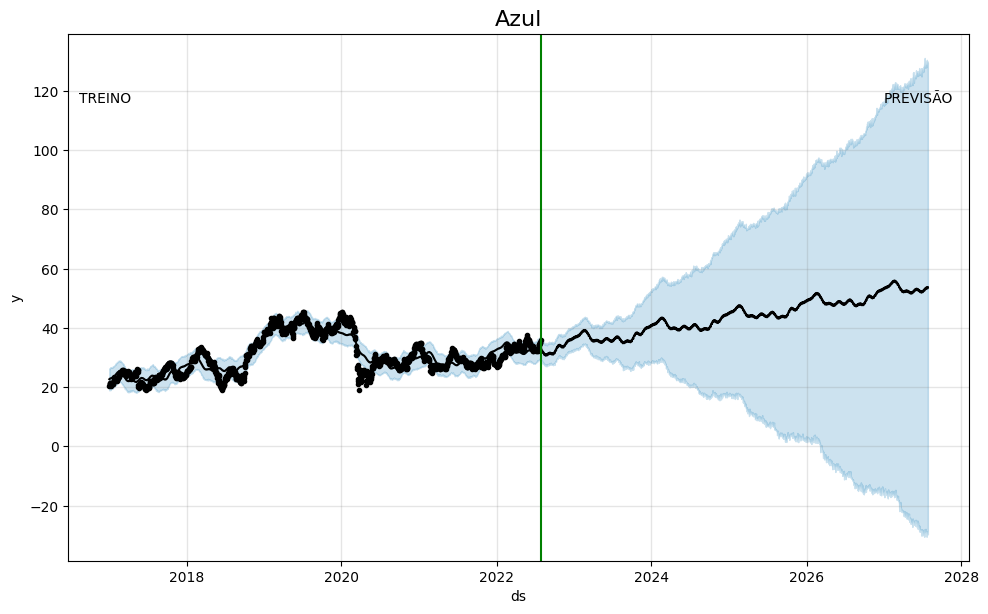

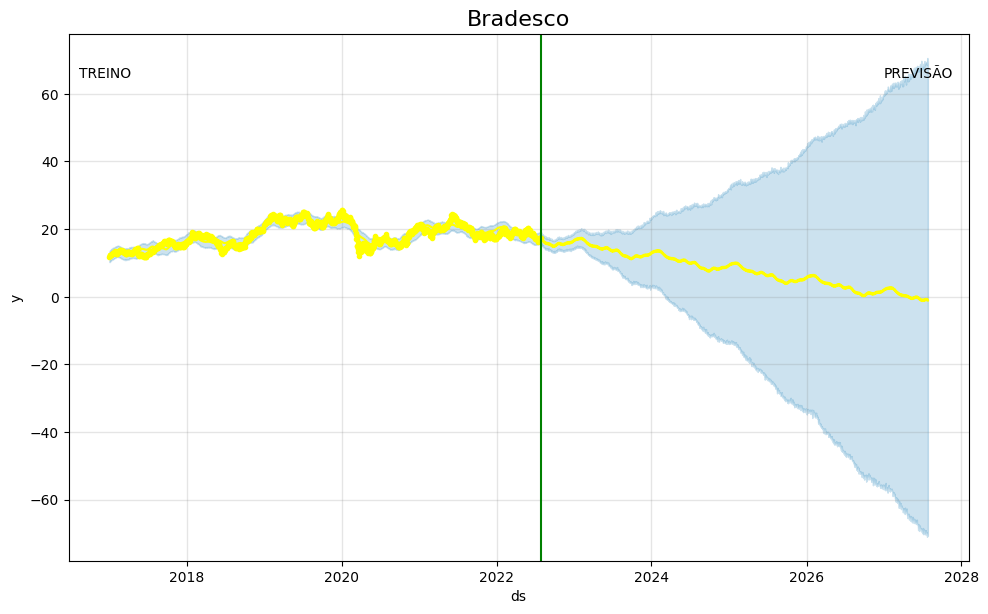

...

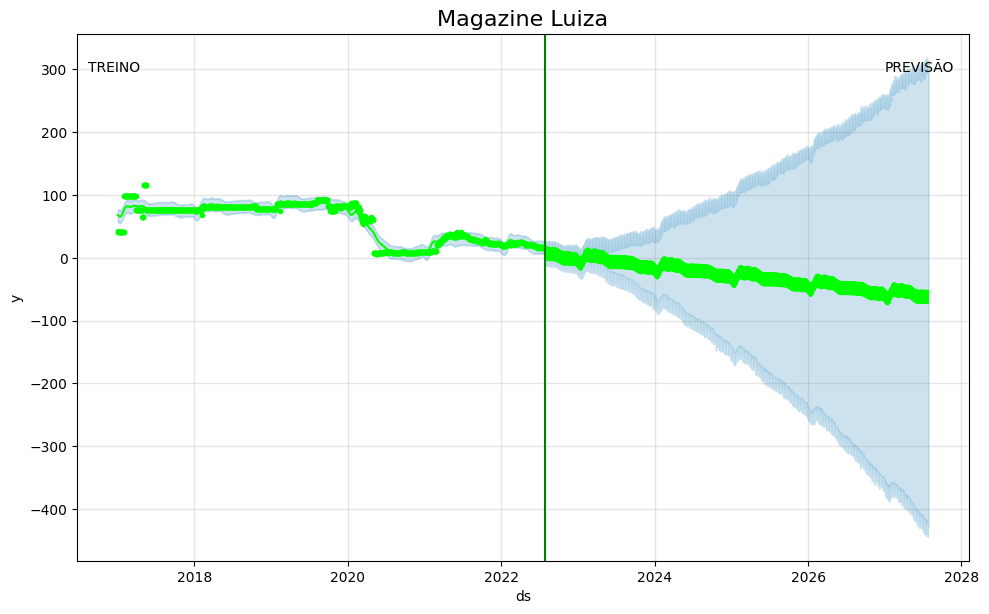

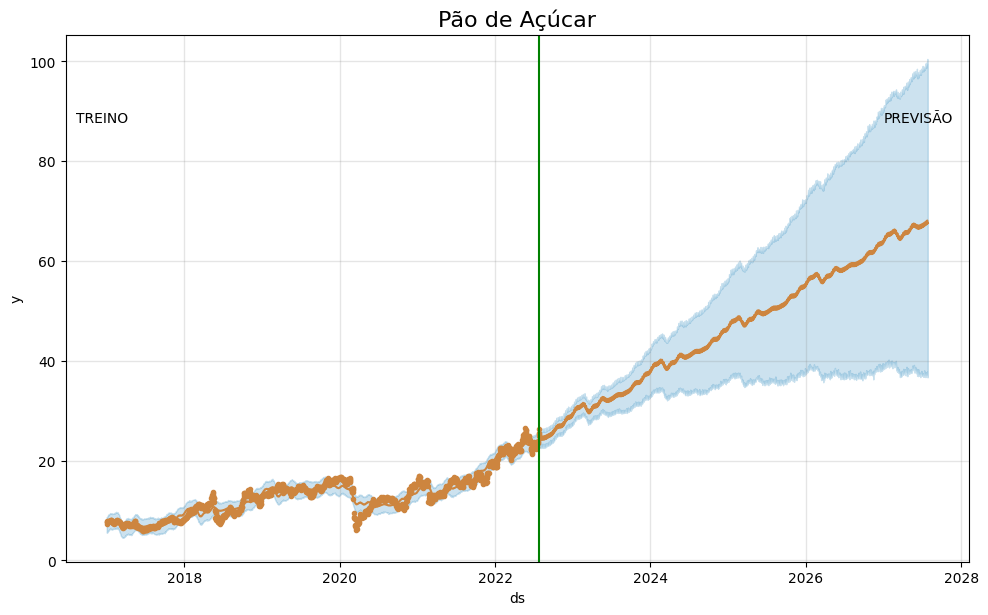

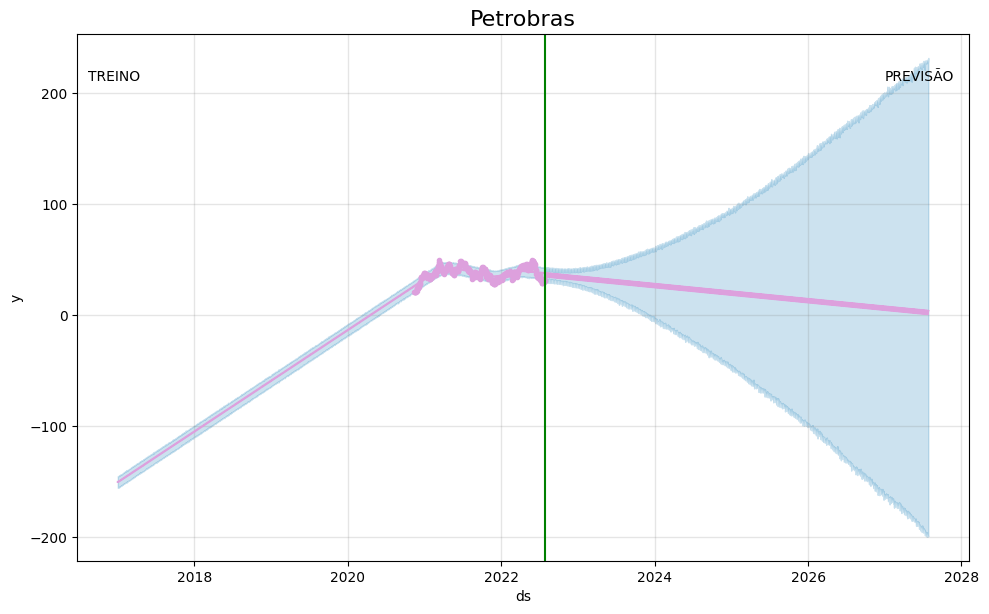

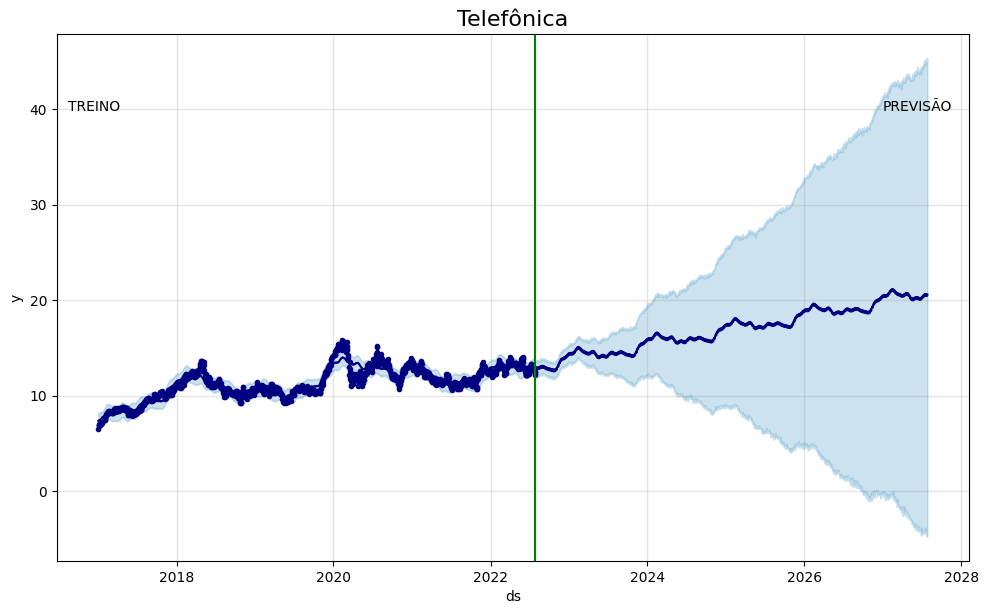

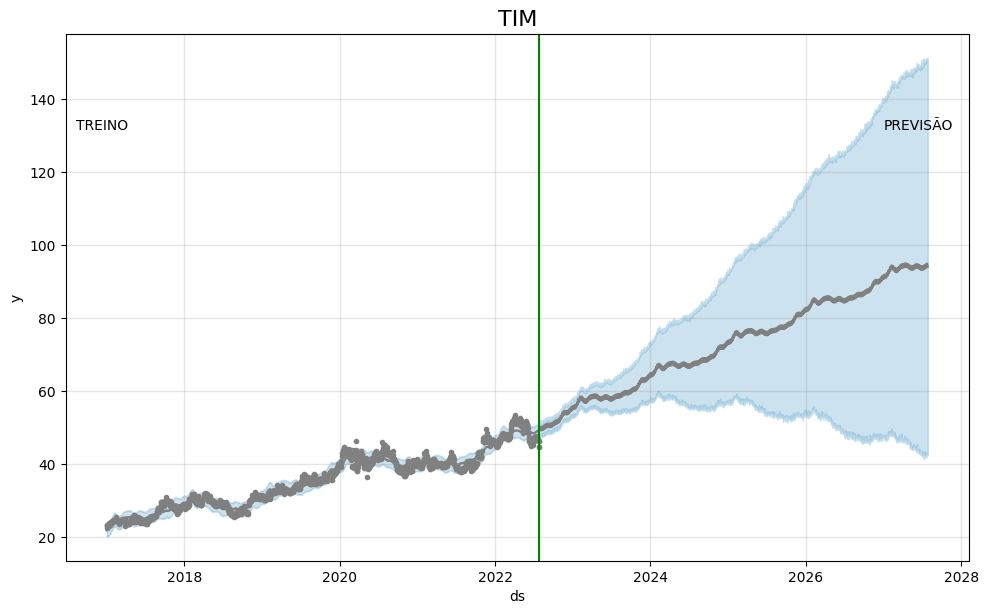

In [ ]:
#PREVISÔES COM PROPHET
#Prepata todo o modelo
#Importa para ele, cada ação individualmente e gera uma previsão para ela
#Plota o gráfico e mostra a tabela de previsões gerada

df_all_Prophet=pd.DataFrame()

for i in range(len(nomes)):
  
  data=df[nomes[i]]
          
  dados=pd.DataFrame(data={'ds': data.index.values.astype('datetime64[D]'), 'y': data.values})

  modelo = Prophet()
  modelo.fit(dados)

  st_futuro = modelo.make_future_dataframe(periods= 1825)

  previsao_Prophet = modelo.predict(st_futuro)

  grafico_previsao_Prophet = modelo.plot(previsao_Prophet)

  ax = grafico_previsao_Prophet.gca()
  ax.set_title(nomes[i], size=16)

  plt.gca().get_lines()[0].set_color(cores[i])
  plt.gca().get_lines()[1].set_color(cores[i])

  plt.axvline(x = df[nomes[i]].tail(1).index, color = "green") 
  plt.text(plt.gca().get_xlim()[0]+50,plt.gca().get_ylim()[1]/1.2, 'TREINO')
  plt.text(plt.gca().get_xlim()[1]-400,plt.gca().get_ylim()[1]/1.2, 'PREVISÃO')

  grafico_previsao_Prophet.show()

  df_all_Prophet[nomes[i]]=previsao_Prophet['yhat']

df_all_Prophet['Date']=st_futuro
df_all_Prophet=df_all_Prophet.set_index('Date')
df_all_Prophet

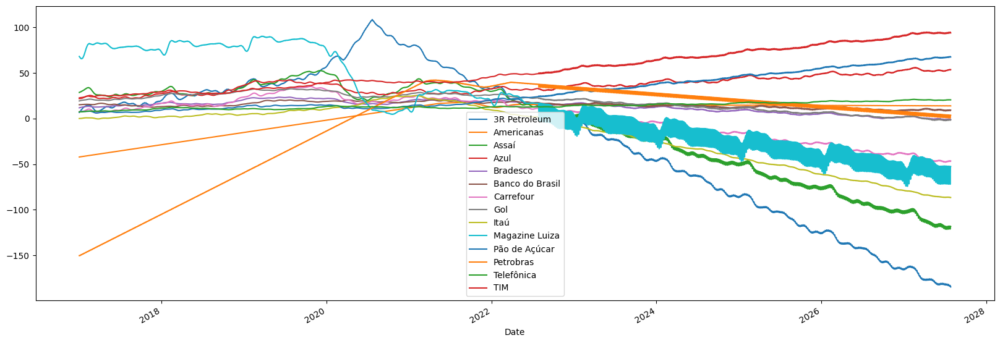

In [ ]:
#Plota todas as previsoes do prophet juntas
df_all_Prophet.plot()

In [ ]:
#Função criada para prever os dados utilizando o NeuralProphet
def prever(data,titulo,cor,dias):

  #Criar modelo
  m = NeuralProphet()
  dados=pd.DataFrame(data={'ds': data.index.values.astype('datetime64[D]'), 'y': data.values})
  metrics = m.fit(dados, freq="D")

  #Cria periodo futuro
  future=m.make_future_dataframe(dados,periods=dias)
  predicao = m.predict(future)

  #padroniza o valor
  dados2=pd.DataFrame(data={'date': predicao['ds'], 'value': predicao['yhat1']}).set_index('date')

  #Gera decomposição
  decomp(dados2,titulo,cor=cor)

  #plota histograma
  sns.displot(data=dados2,  kde=True ,palette=[cor])
  plt.show()

  return dados2

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.62E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.11E-01, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 6.61E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.31E-01, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.13E-01
Epoch[175/175]: 100%|██████████| 175/175 [00:20<00:00,  8.53it/s, SmoothL1Loss=0.00146, MAE=3.69, RMSE=4.61, Loss=0.00115, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

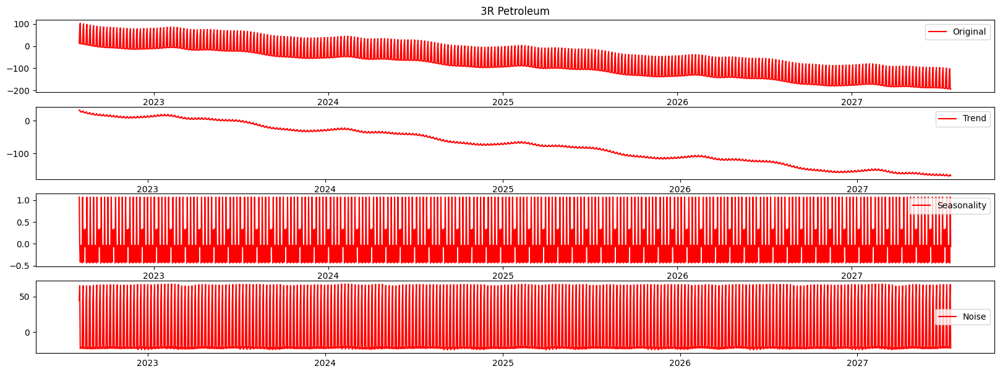

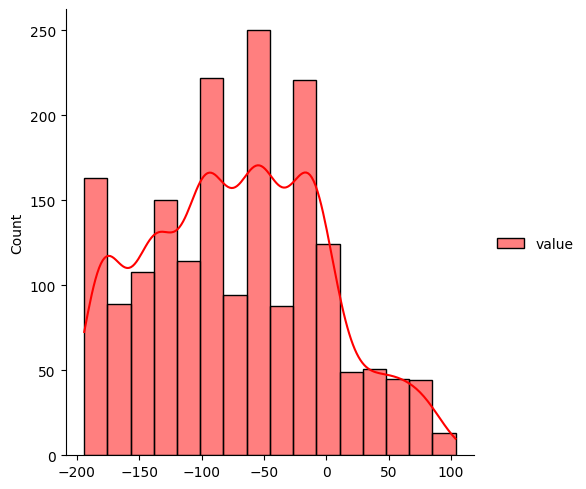

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - dropped 1033 NAN row in 'y'
INFO:NP.forecaster:dropped 1033 NAN row in 'y'
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO:NP.utils:Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_s

  0%|          | 0/116 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.16E-02, min: 1.06E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.16E-02, min: 1.06E-01


  0%|          | 0/116 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.31E-02, min: 1.06E-01
INFO:NP.utils_torch:lr-range-test results: steep: 4.31E-02, min: 1.06E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.06E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 6.06E-02
Epoch[282/282]: 100%|██████████| 282/282 [00:20<00:00, 14.10it/s, SmoothL1Loss=0.00439, MAE=0.511, RMSE=0.648, Loss=0.00362, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of th

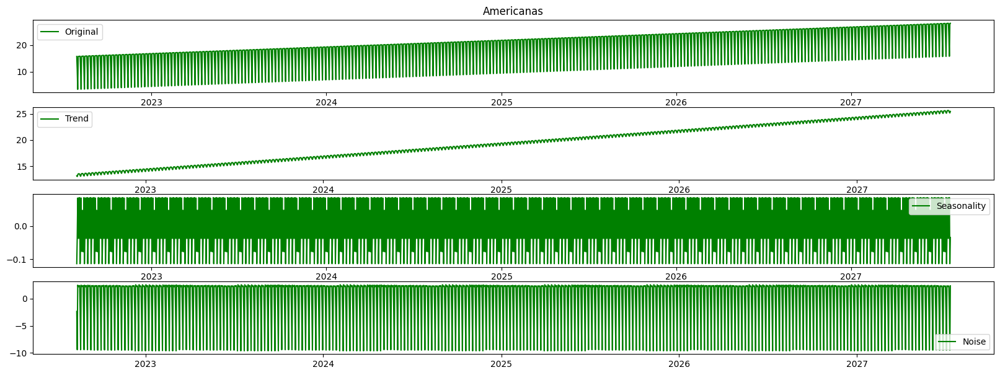

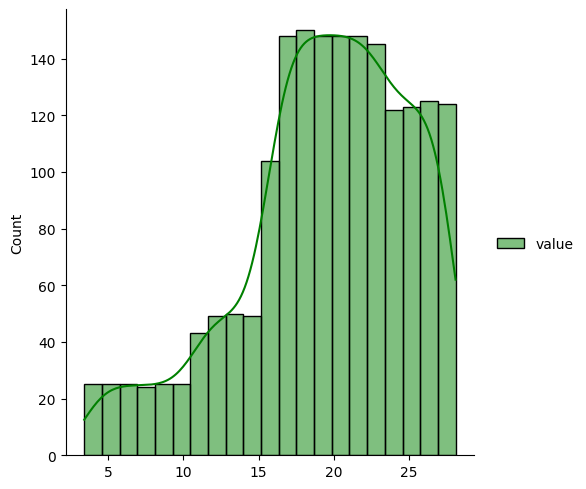

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - dropped 68 NAN row in 'y'
INFO:NP.forecaster:dropped 68 NAN row in 'y'
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
I

  0%|          | 0/128 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.72E-01, min: 2.76E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.72E-01, min: 2.76E+00


  0%|          | 0/128 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.46E-01, min: 2.76E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.46E-01, min: 2.76E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.36E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.36E-01
Epoch[178/178]: 100%|██████████| 178/178 [00:21<00:00,  8.35it/s, SmoothL1Loss=0.00481, MAE=3.29, RMSE=4.19, Loss=0.00354, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

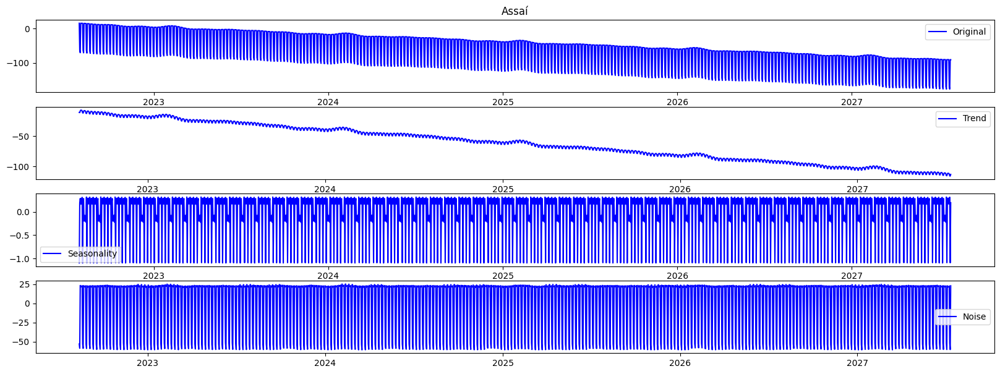

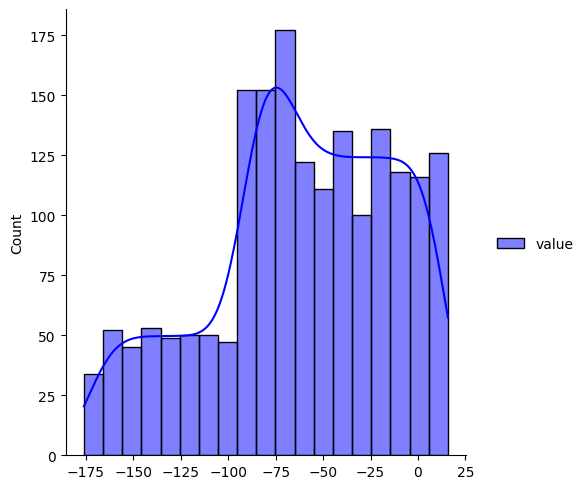

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.49E+00
INFO:NP.utils_torch:lr-range-test results: steep: 6.85E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 7.77E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.83E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 7.37E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:23<00:00,  7.55it/s, SmoothL1Loss=0.00617, MAE=2.06, RMSE=2.57, Loss=0.00463, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

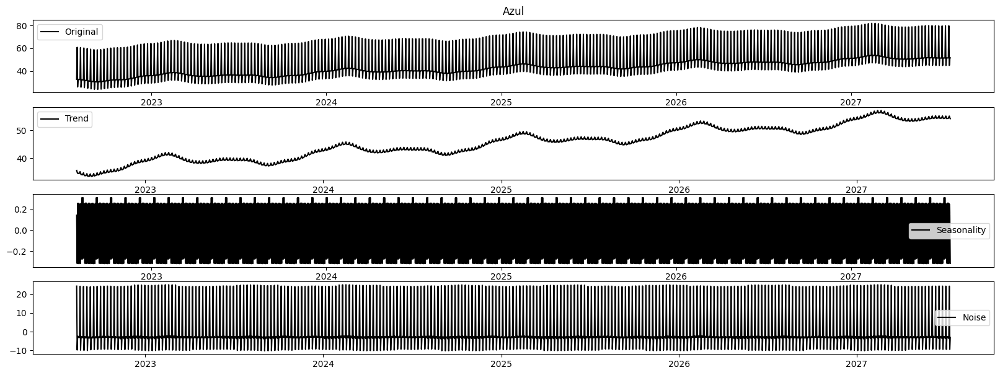

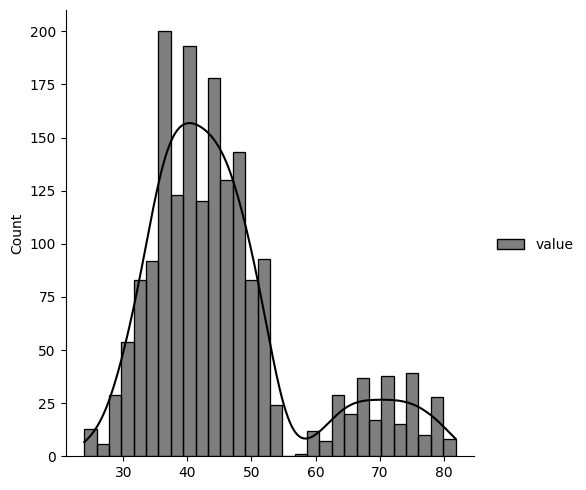

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 3.46E-01
INFO:NP.utils_torch:lr-range-test results: steep: 8.06E-02, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00
INFO:NP.utils_torch:lr-range-test results: steep: 9.47E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 9.14E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:22<00:00,  7.62it/s, SmoothL1Loss=0.00568, MAE=1.01, RMSE=1.27, Loss=0.00436, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

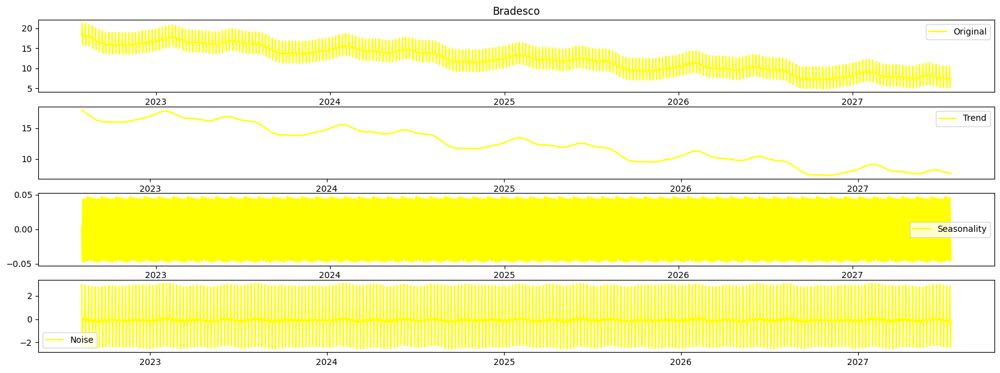

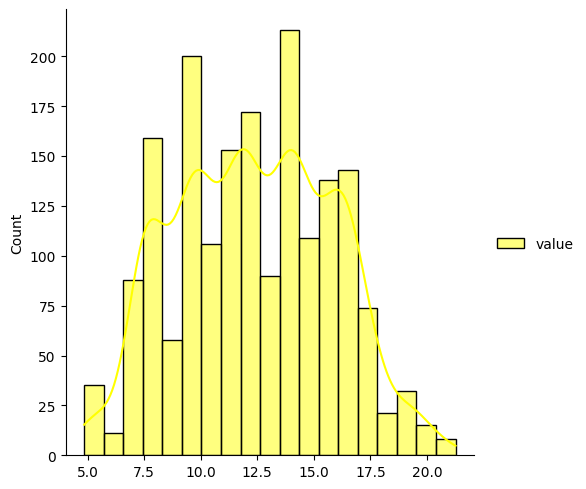

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - dropped 137 NAN row in 'y'
INFO:NP.forecaster:dropped 137 NAN row in 'y'
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32

  0%|          | 0/128 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.50E-02, min: 1.46E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.50E-02, min: 1.46E-01


  0%|          | 0/128 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.67E-02, min: 1.46E-01
INFO:NP.utils_torch:lr-range-test results: steep: 4.67E-02, min: 1.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.36E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 6.36E-02
Epoch[181/181]: 100%|██████████| 181/181 [00:22<00:00,  7.88it/s, SmoothL1Loss=0.00715, MAE=0.821, RMSE=1.05, Loss=0.00586, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the

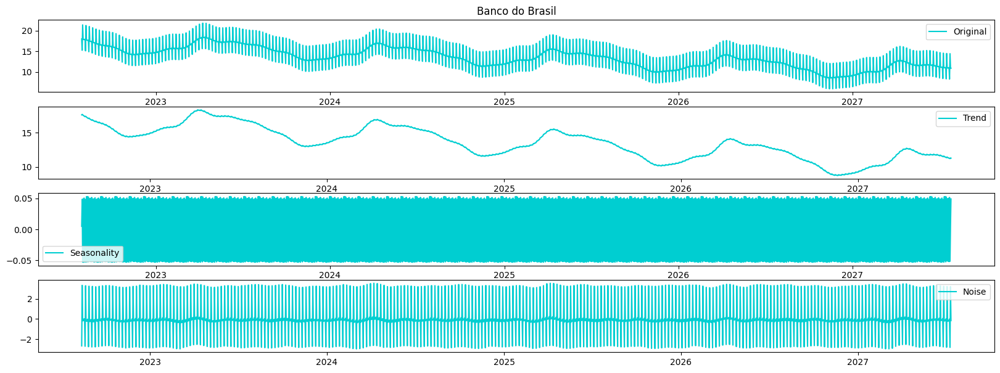

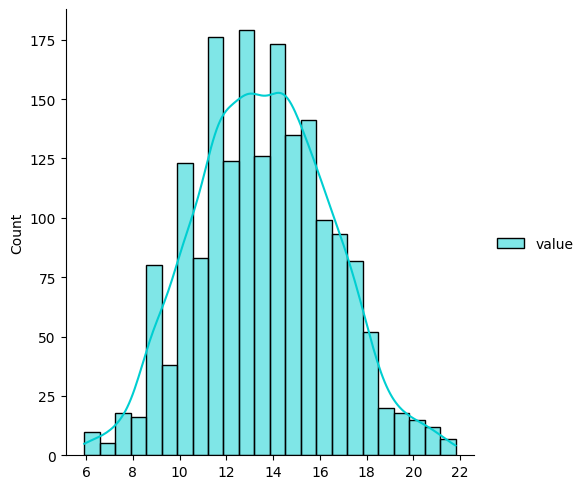

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00
INFO:NP.utils_torch:lr-range-test results: steep: 8.06E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 9.65E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:23<00:00,  7.37it/s, SmoothL1Loss=0.00446, MAE=2.34, RMSE=2.93, Loss=0.0034, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the d

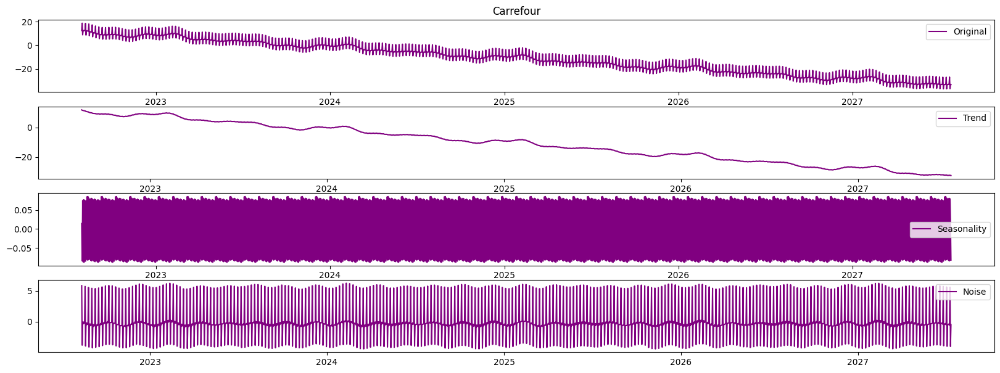

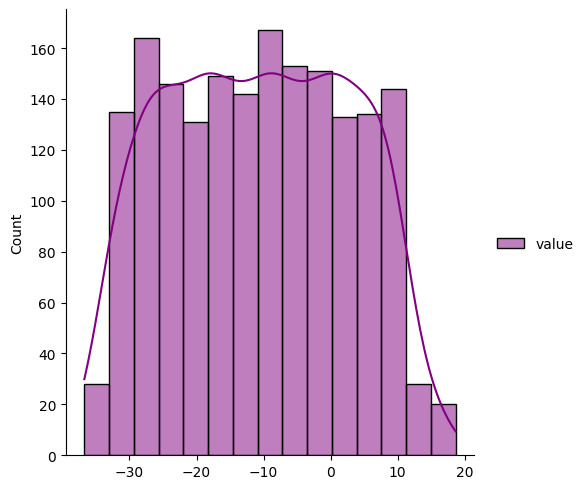

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 9.14E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.31E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.11E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.13E-01
Epoch[175/175]: 100%|██████████| 175/175 [00:24<00:00,  7.19it/s, SmoothL1Loss=0.00652, MAE=1.44, RMSE=1.73, Loss=0.00513, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

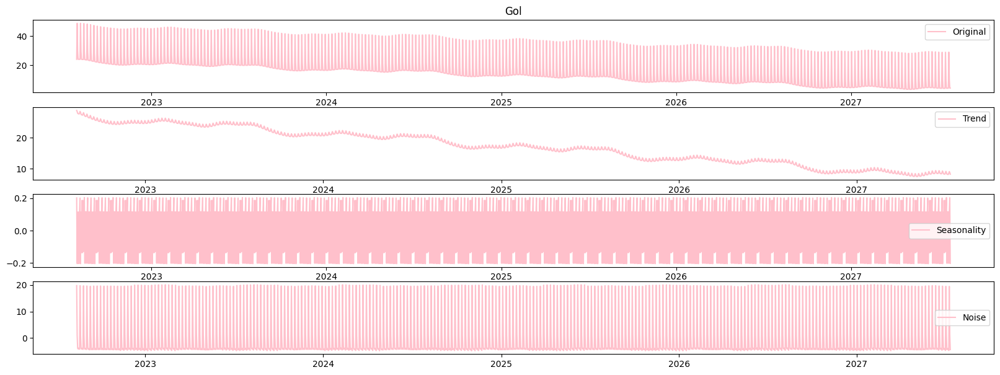

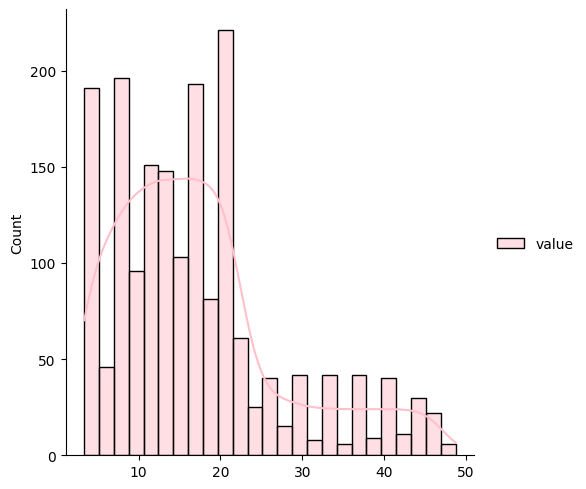

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO:NP.utils_torch:lr-range-test results: steep: 9.47E-02, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO:NP.utils_torch:lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 9.65E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:24<00:00,  7.10it/s, SmoothL1Loss=0.0011, MAE=0.86, RMSE=1.12, Loss=0.000938, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

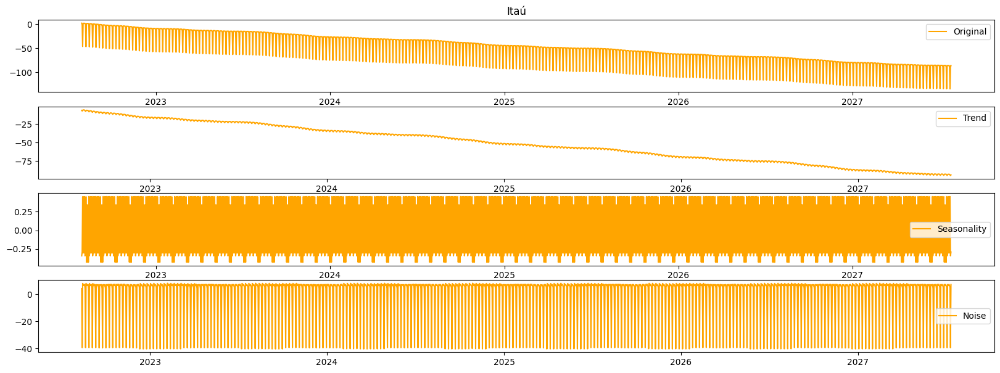

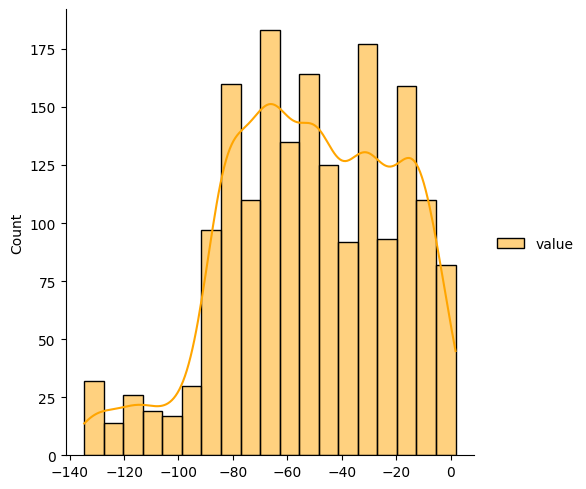

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00
INFO:NP.utils_torch:lr-range-test results: steep: 6.85E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.07E+00, min: 3.46E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.07E+00, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.95E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.95E-01
Epoch[175/175]: 100%|██████████| 175/175 [00:24<00:00,  7.04it/s, SmoothL1Loss=0.00547, MAE=5.88, RMSE=8.7, Loss=0.00383, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the d

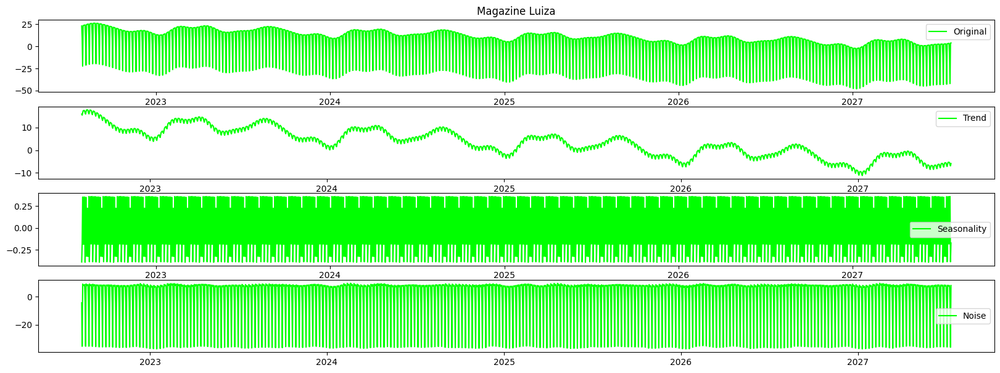

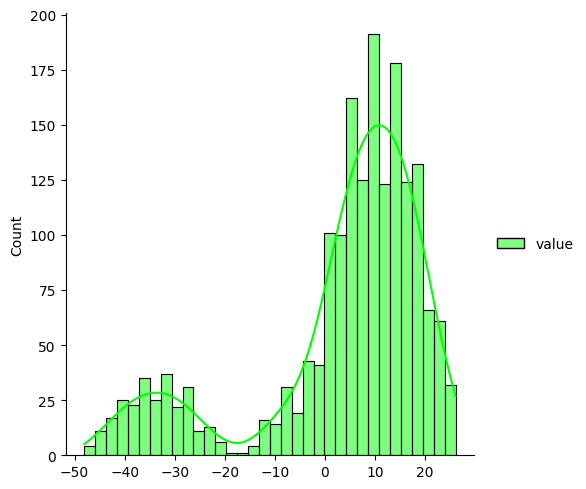

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.84E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.11E-01, min: 2.84E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.42E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.11E-01, min: 5.42E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.07E-01
Epoch[175/175]: 100%|██████████| 175/175 [00:26<00:00,  6.52it/s, SmoothL1Loss=0.00246, MAE=0.928, RMSE=1.16, Loss=0.00187, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the

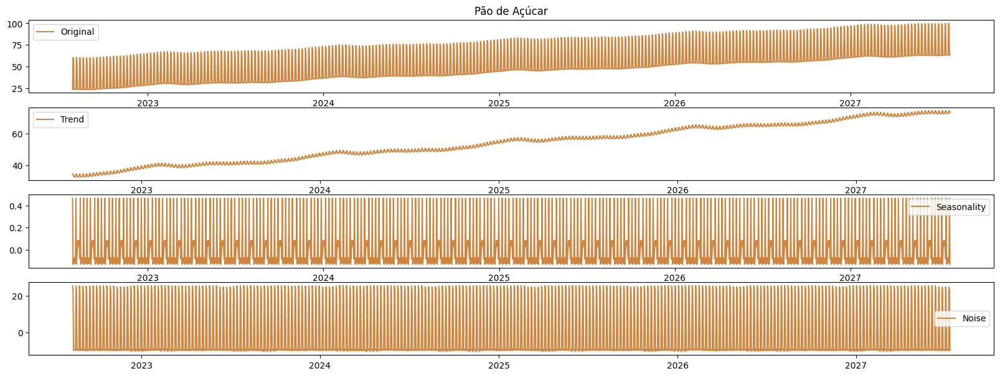

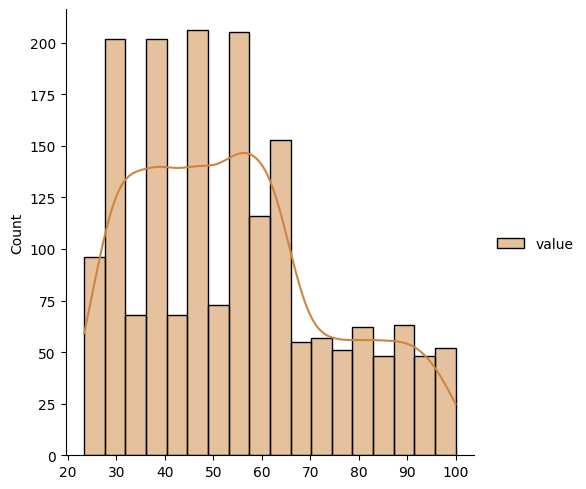

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - dropped 965 NAN row in 'y'
INFO:NP.forecaster:dropped 965 NAN row in 'y'
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO:NP.utils:Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_sea

  0%|          | 0/117 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.35E-01, min: 6.86E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.35E-01, min: 6.86E+00


  0%|          | 0/117 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.35E-01, min: 2.75E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.35E-01, min: 2.75E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.22E-01
INFO:NP.forecaster:lr-range-test selected learning rate: 1.22E-01
Epoch[262/262]: 100%|██████████| 262/262 [00:21<00:00, 12.08it/s, SmoothL1Loss=0.00974, MAE=2.81, RMSE=3.52, Loss=0.00833, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the 

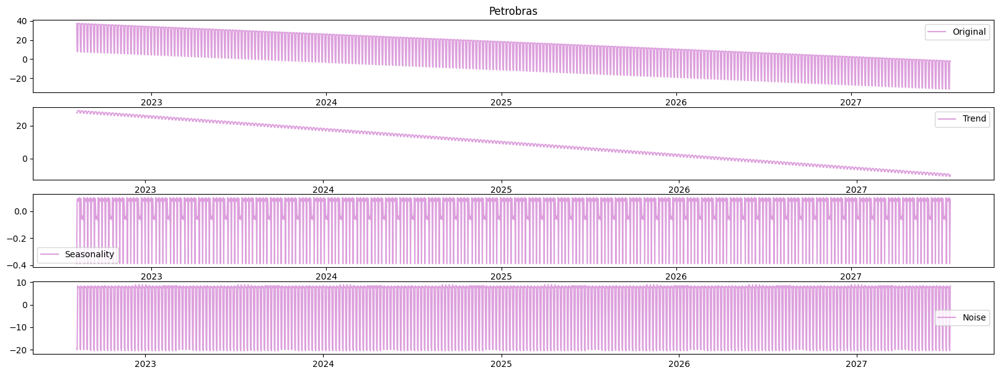

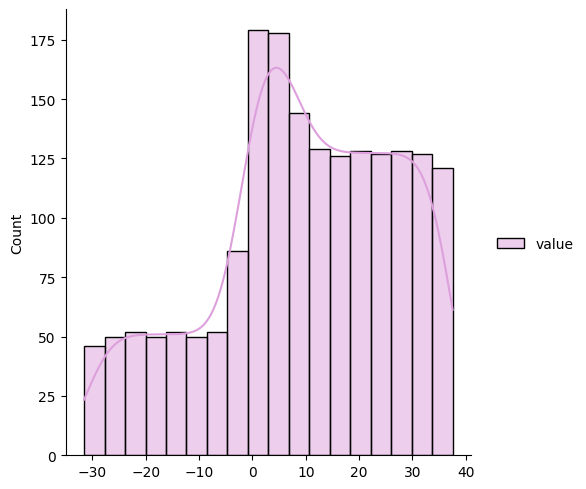

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.31E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.83E-02, min: 1.31E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.31E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.83E-02, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 6.98E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:26<00:00,  6.59it/s, SmoothL1Loss=0.00373, MAE=0.491, RMSE=0.627, Loss=0.00285, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of th

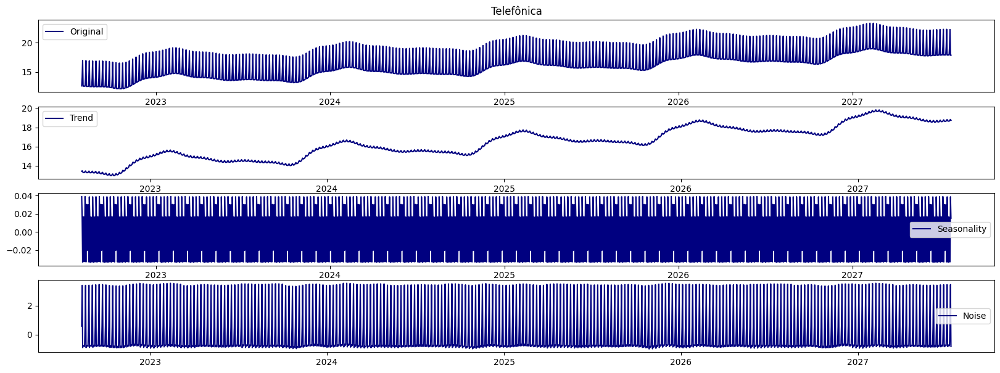

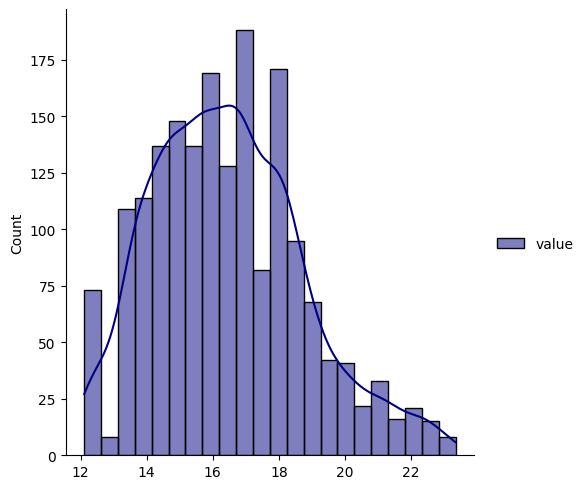

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 175
INFO:NP.config:Auto-set epochs to 175


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 9.14E-01
INFO:NP.utils_torch:lr-range-test results: steep: 5.83E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.26E+00
INFO:NP.utils_torch:lr-range-test results: steep: 5.83E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
INFO:NP.forecaster:lr-range-test selected learning rate: 6.98E-02
Epoch[175/175]: 100%|██████████| 175/175 [00:26<00:00,  6.64it/s, SmoothL1Loss=0.00165, MAE=1.18, RMSE=1.45, Loss=0.0013, RegLoss=0]
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.107% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.107% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.945% of the d

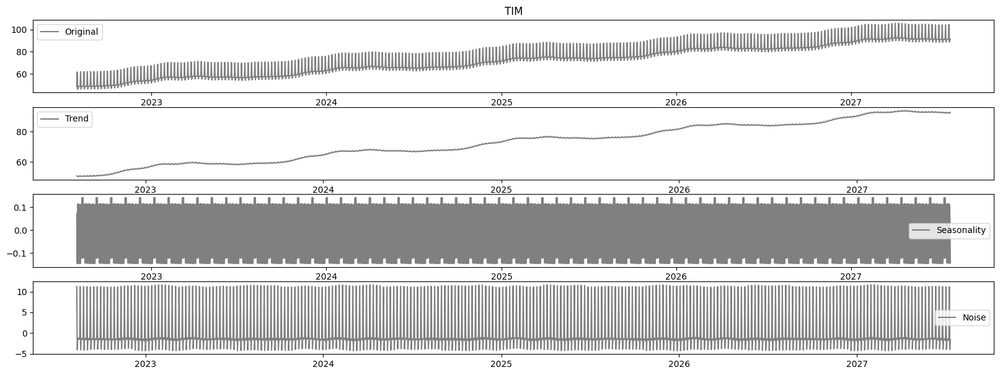

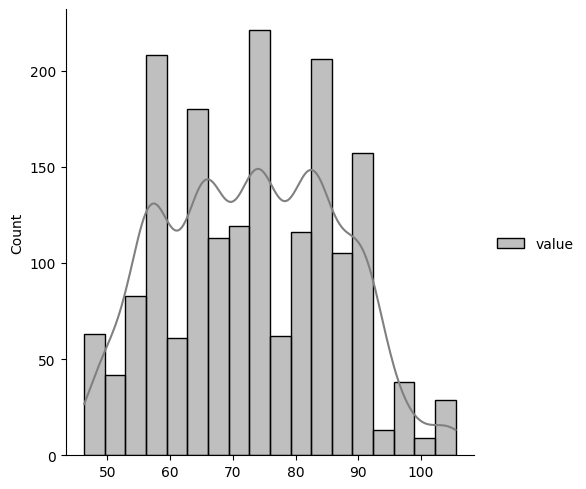

In [ ]:
#Plota a decomposição de todas as previsões criadas com o NeuralProphet
#Também cria o gráfico de barras dessa previsão

df_futuro_NeuralProphet=pd.DataFrame()

for i in range(len(nomes)):
  df_futuro_NeuralProphet[nomes[i]]=prever(df[nomes[i]],nomes[i],cores[i],1825)

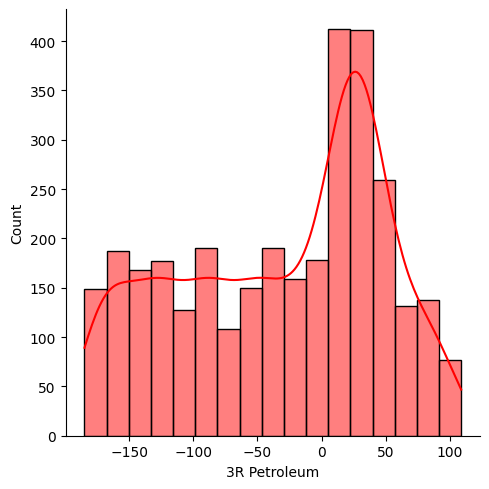

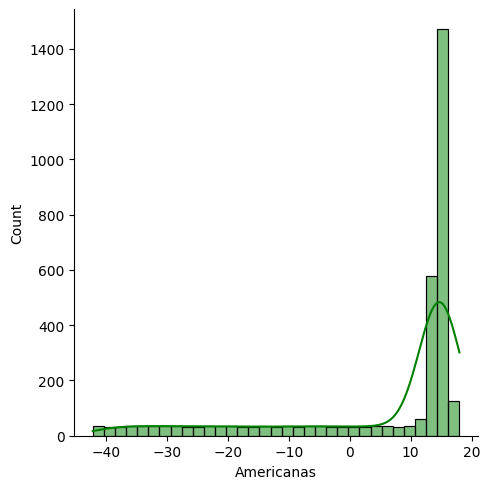

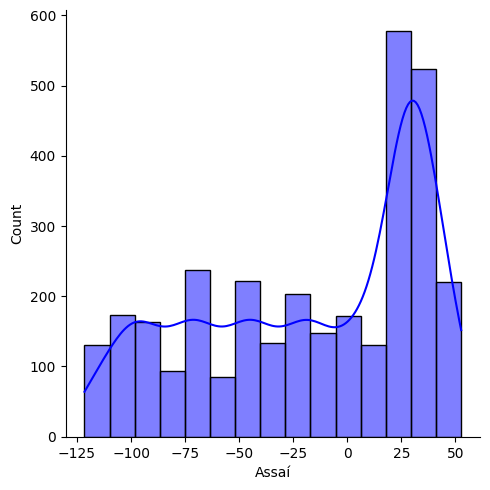

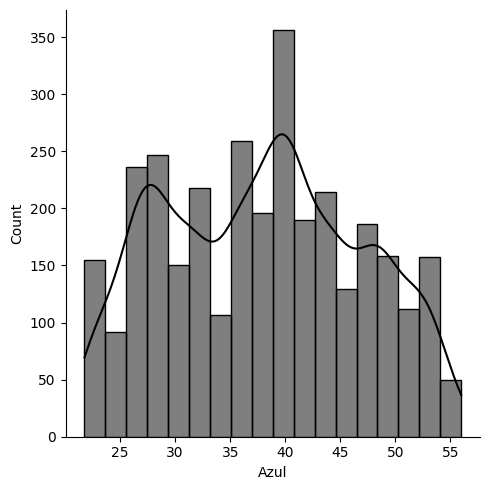

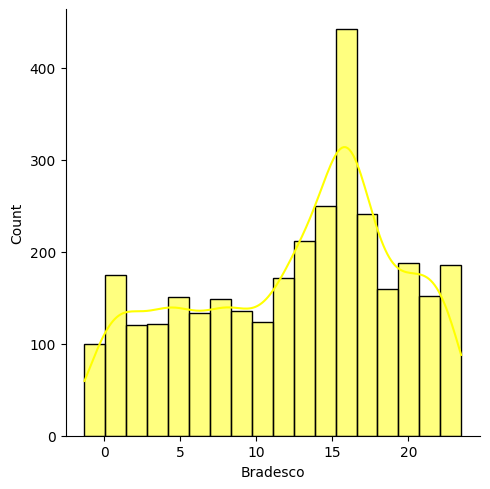

...

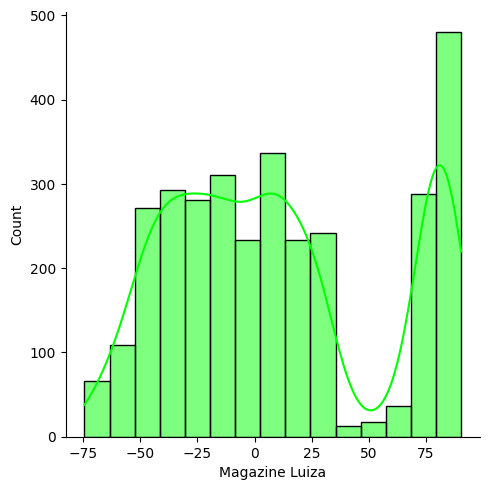

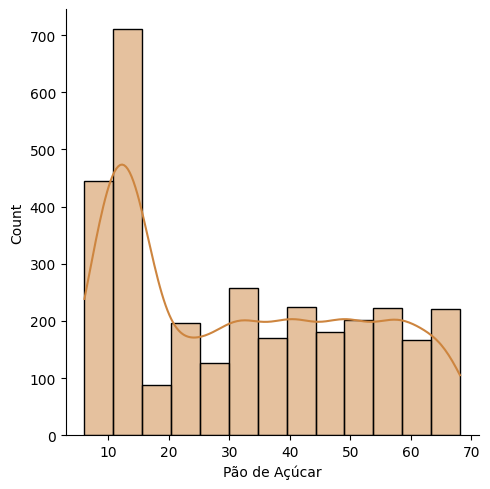

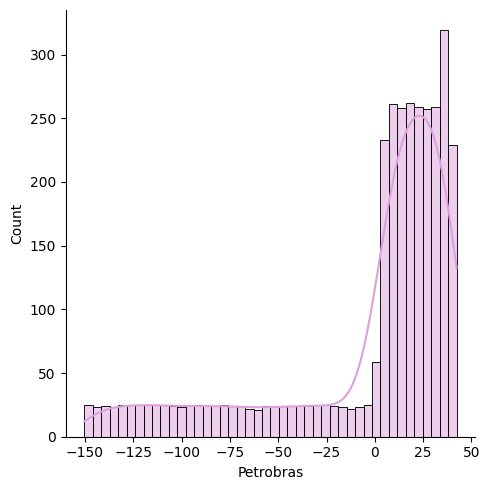

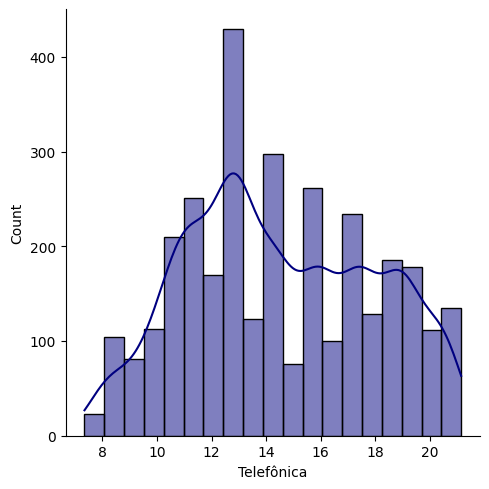

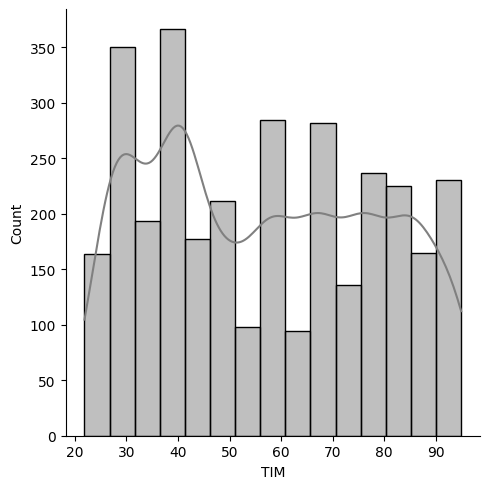

In [ ]:
for i in range(len(nomes)):
  sns.displot(data=df_all_Prophet[nomes[i]],  kde=True ,color=cores[i])
  plt.show()

In [ ]:
#Função criada para saber os retornos de investimento em uma ação específica em um prazo em dias de um investimento X
def investir(acao,investimento,prazo):

  start_data=df_all_Prophet[acao].index[-1825]
  start_valor=df_all_Prophet[acao][-1825]

  end_data=df_all_Prophet[acao].index[-1825+prazo]
  end_valor=df_all_Prophet[acao][-1825+prazo]


  percentual=end_valor/start_valor

  print("-------------------------------------------")

  print("Ação - ",acao)

  print("\nData de Início:",start_data)
  print("Data de Término:",end_data)
  print("Prazo:",prazo," Dias")

  print("\nCotação Inicial: R$",round(start_valor,5))
  print("Cotação Final: R$",round(end_valor,5))

  print("\nPercentual Resultante:",round(percentual,5),"%")

  print("\nInvestimento Inicial: R$",investimento)
  print("Investimento Final: R$",round(investimento*percentual,5))

  print("-------------------------------------------")



In [ ]:
#Utilizado para estimar os valores de investimento de todas as ações com um valor inicial e um prazo igual
for i in range(len(nomes)):
  investir(nomes[i],1000,30)

-------------------------------------------
Ação -  3R Petroleum

Data de Início: 2022-07-29 00:00:00
Data de Término: 2022-08-28 00:00:00
Prazo: 30  Dias

Cotação Inicial: R$ 12.9302
Cotação Final: R$ 8.85574

Percentual Resultante: 0.68489 %

Investimento Inicial: R$ 1000
Investimento Final: R$ 684.8878
-------------------------------------------
-------------------------------------------
Ação -  Americanas

Data de Início: 2022-07-29 00:00:00
Data de Término: 2022-08-28 00:00:00
Prazo: 30  Dias

Cotação Inicial: R$ 15.39177
Cotação Final: R$ 15.41287

Percentual Resultante: 1.00137 %

Investimento Inicial: R$ 1000
Investimento Final: R$ 1001.37067
-------------------------------------------
-------------------------------------------
Ação -  Assaí

Data de Início: 2022-07-29 00:00:00
Data de Término: 2022-08-28 00:00:00
Prazo: 30  Dias

Cotação Inicial: R$ 12.91288
Cotação Final: R$ 5.71376

Percentual Resultante: 0.44249 %

Investimento Inicial: R$ 1000
Investimento Final: R$ 442.

In [ ]:
# Conectar ao Bigquery do google

!pip install google-cloud
!pip install google-cloud-bigquery[pandas]
!pip install google-cloud-storage

!pip install --upgrade 'google-cloud-bigquery[bqstorage,pandas]'

%load_ext google.cloud.bigquery


In [ ]:
# Documentation for reference: https://colab.research.google.com/notebooks/bigquery.ipynb#scrollTo=ONI1Xo0-KtAD
# Set Projec ID and google colab authentication
project_id='stockportifoliolakehouse'
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

In [ ]:
#Test bigquery project retrieve data
from google.cloud import bigquery
client = bigquery.Client(project=project_id)
import humanize
